## Siemens FDA

**Index**

1. Loading the datasets
2. Transposing the time series datasets
3. Merging time series datasets to add additional features
4. Filtering and spliting in Blood and aqueous groups
5. Window extraction
   - 5.1. Validating if there are partial or full missing values after the extraction
   - 5.2 Visualize the origin window intervals in different groups of Features
6. Additional Functions
   7.1. Visualization of plots with raw data after the extraction.
   7.2. Visualization of plots with data centered after the extraction.
7. Visualization of Time Series from the Windows
8. Functional PCA (Visualization of Principal Component Plots in one row)
    - 8.1. Functional PCA characterization function
    - 8.2 Functional PC1 plots (both systems)  Characterization of FPC Scores
    - 8.3 Linear Reregression
9. Fuctional regression
     

The improvements with respect to the code "Siemens_FDA.ipynb" are:
- Change the part in "Filtering and spliting in Bloods and Aqueous groups" for sample the data
- Change the "Merge data" Function in "Additional functions"
- Add 8.3 "Linear Regression" to make statistic summary for PCA(still developing)
- Update 7.2 function "plot_all_time_series_in_group" with a new function to save the photos

# 1. Loading the datasets

In [1]:
#!pip install scikit-fda

In [2]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
import random
from sklearn.decomposition import PCA
from skfda.representation.grid import FDataGrid
from skfda.preprocessing.dim_reduction.projection import FPCA
from sklearn.preprocessing import OneHotEncoder
import skfda
from skfda.ml.regression import LinearRegression
from skfda.representation.basis import FDataBasis, FourierBasis

/var/folders/_c/wdm33bq11dvflh73ffxrd8z40000gn/T/ipykernel_4321/2677705551.py:9: DeprecationWarning: The module "projection" is deprecated. Please use "dim_reduction"
  from skfda.preprocessing.dim_reduction.projection import FPCA


# 2. Transposing the time series datasets

You can change this part based on where you store the data

In [3]:
# Import datasets
sensorA_System1 = pd.read_csv("RawData/System1_SensorA.csv")
sensorA_System2 = pd.read_csv("RawData/System2_SensorA.csv")
sensorB_System1 = pd.read_csv("RawData/System1_SensorB.csv")
sensorB_System2 = pd.read_csv("RawData/System2_SensorB.csv")
sensorA_System1_missing = pd.read_csv("RawData/SensorA_System1_missing values.csv")
sensorA_System2_missing = pd.read_csv("RawData/SensorA_System2_missing values.csv")
keyByTestID = pd.read_csv("RawData/Key by TestID.csv", parse_dates=['DateTime'])

# 3. Merging time series datasets to add additional features

In [4]:
# Transpose dataset to make columns as timestamps and rows as tests

# Sensor A
A1_transposed = sensorA_System1.T.reset_index()
A1_transposed.columns = A1_transposed.iloc[0]
A1_transposed.rename(columns={A1_transposed.columns[0]: 'TestID'}, inplace=True)
A1_transposed = A1_transposed.drop(0)
A1_transposed['TestID'] = A1_transposed['TestID'].astype(int)

A2_transposed = sensorA_System2.T.reset_index()
A2_transposed.columns = A2_transposed.iloc[0]
A2_transposed.rename(columns={A2_transposed.columns[0]: 'TestID'}, inplace=True)
A2_transposed = A2_transposed.drop(0)
A2_transposed['TestID'] = A2_transposed['TestID'].astype(int)

A1_missing_transposed = sensorA_System1_missing.T.reset_index()
A1_missing_transposed.columns = A1_missing_transposed.iloc[0]
A1_missing_transposed.rename(columns={A1_missing_transposed.columns[0]: 'TestID'}, inplace=True)
A1_missing_transposed = A1_missing_transposed.drop(0)
A1_missing_transposed['TestID'] = A1_missing_transposed['TestID'].astype(int)

A2_missing_transposed = sensorA_System2_missing.T.reset_index()
A2_missing_transposed.columns = A2_missing_transposed.iloc[0]
A2_missing_transposed.rename(columns={A2_missing_transposed.columns[0]: 'TestID'}, inplace=True)
A2_missing_transposed = A2_missing_transposed.drop(0)
A2_missing_transposed['TestID'] = A2_missing_transposed['TestID'].astype(int)

# Sensor B
B1_transposed = sensorB_System1.T.reset_index()
B1_transposed.columns = B1_transposed.iloc[0]
B1_transposed.rename(columns={B1_transposed.columns[0]: 'TestID'}, inplace=True)
B1_transposed = B1_transposed.drop(0)
B1_transposed['TestID'] = B1_transposed['TestID'].astype(int)

B2_transposed = sensorB_System2.T.reset_index()
B2_transposed.columns = B2_transposed.iloc[0]
B2_transposed.rename(columns={B2_transposed.columns[0]: 'TestID'}, inplace=True)
B2_transposed = B2_transposed.drop(0)
B2_transposed['TestID'] = B2_transposed['TestID'].astype(int)

In [5]:
# Complete A1 and A2 with the missing values
A1_transposed_mid = A1_transposed[~A1_transposed.TestID.isin(A1_missing_transposed.TestID)]
A1_transposed = pd.concat([A1_transposed_mid, A1_missing_transposed], axis=0)
A2_transposed_mid = A2_transposed[~A2_transposed.TestID.isin(A2_missing_transposed.TestID)]
A2_transposed = pd.concat([A2_transposed_mid, A2_missing_transposed], axis=0)

In [6]:
# Create new column to fill fluid temperature NA's
# Note: Fluid temperature: If specified, take as the temperature of the sample fluid. The rest of the system temperature can be taken as ambient temperature.

keyByTestID['Fluid_Temperature_Filled'] = keyByTestID['Fluid Temperature'].combine_first(keyByTestID['AmbientTemperature'])
keyByTestID.head(3)

,TestID,FluidType,DateTime,Lot,CardNumber,AgeOfCardInDaysAtTimeOfTest,ReaderSerialNumber,SampleDetectTime,BubbleDetectTime,System,Sensor,AmbientTemperature,Fluid Temperature,CardReturnCode,ReturnCode,Results Error Code,Device Return Code,Bge Test ReturnCode,Fluid_Temperature_Filled
0,3550995,Eurotrol L1,2024-02-07 10:32:15,16-23333-20,302910,70,73,180.4,178.8,System 2A,Sensor A,21.2345,NaN,NaN,Success,NoError,NoError,Success,21.2345
1,3550995,Eurotrol L1,2024-02-07 10:32:15,16-23333-20,302910,70,73,180.4,178.8,System 2A,Sensor B,21.2345,NaN,NaN,Success,NoError,NoError,Success,21.2345
2,3551012,Eurotrol L1,2024-02-07 10:41:33,16-23333-20,303096,70,73,183.2,181.6,System 2A,Sensor A,21.5012,NaN,NaN,Success,NoError,NoError,Success,21.5012


In [7]:
# Relabeling System Values
keyByTestID["System"] = keyByTestID["System"].replace({"System 2A":"System 2","System 2B":"System 2"})
keyByTestID.tail(3)

,TestID,FluidType,DateTime,Lot,CardNumber,AgeOfCardInDaysAtTimeOfTest,ReaderSerialNumber,SampleDetectTime,BubbleDetectTime,System,Sensor,AmbientTemperature,Fluid Temperature,CardReturnCode,ReturnCode,Results Error Code,Device Return Code,Bge Test ReturnCode,Fluid_Temperature_Filled
24255,3518677,HNB,2023-09-19 16:54:21,16-23151-20,302186,111,23,459.0,454.8,System 2,Sensor B,25.2250,15.0,NaN,Success,NoError,NoError,Success,15.0
24256,3518678,HNB,2023-09-19 16:54:23,16-23137-20,300820,125,33,459.2,455.2,System 2,Sensor A,24.4908,15.0,NaN,Success,NoError,NoError,Success,15.0
24257,3518678,HNB,2023-09-19 16:54:23,16-23137-20,300820,125,33,459.2,455.2,System 2,Sensor B,24.4908,15.0,NaN,Success,NoError,NoError,Success,15.0


In [8]:
# Merge dataset with keyByTestID and delete unmatched tests
keyByTestID['TestID'] = keyByTestID['TestID'].astype(int)
keyByTestID['System'] = keyByTestID['System'].astype(str)
keyByTestID = keyByTestID[keyByTestID['ReturnCode'].isin(['Success','UnderReportableRange'])]

A1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] == 'System 1')]
A1_Merged = pd.merge(A1_keyByTestID,A1_transposed,how='inner', on=['TestID'])
A1_transposed = A1_transposed[A1_transposed['TestID'].isin(A1_Merged['TestID'])]

A2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor A') & (keyByTestID['System'] != 'System 1')]
A2_Merged = pd.merge(A2_keyByTestID,A2_transposed,how='inner', on=['TestID'])
A2_transposed = A2_transposed[A2_transposed['TestID'].isin(A2_Merged['TestID'])]

sensorA_System1 = sensorA_System1.loc[:, sensorA_System1.columns.isin(A1_Merged['TestID'].astype(str))]
sensorA_System2 = sensorA_System2.loc[:, sensorA_System2.columns.isin(A2_Merged['TestID'].astype(str))]


B1_keyByTestID = keyByTestID[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] == 'System 1')]
B1_Merged = pd.merge(B1_keyByTestID,B1_transposed,how='inner', on=['TestID'])
B1_transposed = B1_transposed[B1_transposed['TestID'].isin(B1_Merged['TestID'])]

B2_keyByTestID = keyByTestID.loc[(keyByTestID['Sensor'] == 'Sensor B') & (keyByTestID['System'] != 'System 1')]
B2_Merged = pd.merge(B2_keyByTestID,B2_transposed,how='inner', on=['TestID'])
B1_transposed = B2_transposed[B2_transposed['TestID'].isin(A2_Merged['TestID'])]

sensorB_System1 = sensorB_System1.loc[:, sensorB_System1.columns.isin(B1_Merged['TestID'].astype(str))]
sensorB_System2 = sensorB_System2.loc[:, sensorB_System2.columns.isin(B2_Merged['TestID'].astype(str))]

print('A1: ', A1_Merged.shape)
print('A2: ', A2_Merged.shape)
print('B1: ', B1_Merged.shape)
print('B2: ', B2_Merged.shape)

A1:  (3382, 3377)
A2:  (7743, 3368)
B1:  (3375, 3377)
B2:  (7745, 3368)


In [9]:
# Remove the testID only exists in one sensor
# Only run once
A1_Merged = A1_Merged[A1_Merged["TestID"].isin(B1_Merged["TestID"])]
B1_Merged = B1_Merged[B1_Merged["TestID"].isin(A1_Merged["TestID"])]

A2_Merged = A2_Merged[A2_Merged["TestID"].isin(B2_Merged["TestID"])]
B2_Merged = B2_Merged[B2_Merged["TestID"].isin(A2_Merged["TestID"])]
print('A1: ', A1_Merged.shape)
print('A2: ', A2_Merged.shape)
print('B1: ', B1_Merged.shape)
print('B2: ', B2_Merged.shape)

A1:  (3374, 3377)
A2:  (7743, 3368)
B1:  (3374, 3377)
B2:  (7743, 3368)


In [10]:
# Resampling to balance the datasets
def  Resample(Merge_data,FluidType="Blood",random_state = 42):
    """
    Resamples a given dataset based on the specified fluid type.

    Parameters:
    Merge_data (pd.DataFrame): The input dataset containing a 'FluidType' column and a 'TestID' column.
    FluidType (str): The type of fluid to resample. Can be "Blood" or "Aqueous". Default is "Blood".
    random_state (int): The seed for the random number generator to ensure reproducibility. Default is 42.

    Returns:
    list: A list of sampled TestIDs based on the specified fluid type.

    Notes:
    - For "Aqueous" fluid type, the function samples 52 TestIDs for each type in the predefined list of blood types.
    - For "Blood" fluid type, the function samples 30 TestIDs for each type that is not in the predefined list of blood types.
    """
    Fluid = pd.unique(Merge_data['FluidType'])
    Aqueous = ['Eurotrol L1', 'Eurotrol L3', 'Eurotrol L4', 'Eurotrol L5']
    Blood = Fluid[~np.isin(Fluid, Aqueous)]
    SampleID = []
    if FluidType == "Blood":
        for types in Blood:
            ID = list(Merge_data[Merge_data['FluidType'] ==types].sample(n=30, random_state=42).TestID)
            SampleID.extend(ID)
    elif FluidType == "Aqueous":
        for types in Aqueous:
            ID = Merge_data[Merge_data['FluidType'] ==types].sample(n=52, random_state=42).TestID
            SampleID.extend(ID)
    return SampleID

# 4. Filtering and spliting in Blood and Aqueous groups

In [11]:
# Extract Blood
System1_ID_Blood = Resample(A1_Merged,"Blood")
System2_ID_Blood = Resample(A2_Merged,"Blood")

A1_blood_Merged = A1_Merged[A1_Merged["TestID"].isin(System1_ID_Blood)].copy().reset_index(drop=True)
A2_blood_Merged = A2_Merged[A2_Merged["TestID"].isin(System2_ID_Blood)].copy().reset_index(drop=True)
B1_blood_Merged = B1_Merged[B1_Merged["TestID"].isin(System1_ID_Blood)].copy().reset_index(drop=True)
B2_blood_Merged = B2_Merged[B2_Merged["TestID"].isin(System2_ID_Blood)].copy().reset_index(drop=True)


# Extract Aqueous
System1_ID_Aqueous = Resample(A1_Merged,"Aqueous")
System2_ID_Aqueous = Resample(A2_Merged,"Aqueous")

A1_aqueous_Merged = A1_Merged[A1_Merged["TestID"].isin(System1_ID_Aqueous)].copy().reset_index(drop=True)
A2_aqueous_Merged = A2_Merged[A2_Merged["TestID"].isin(System2_ID_Aqueous)].copy().reset_index(drop=True)
B1_aqueous_Merged = B1_Merged[B1_Merged["TestID"].isin(System1_ID_Aqueous)].copy().reset_index(drop=True)
B2_aqueous_Merged = B2_Merged[B2_Merged["TestID"].isin(System2_ID_Aqueous)].copy().reset_index(drop=True)

print("A1_blood_Merged shape:", A1_blood_Merged.shape)
print("A2_blood_Merged shape:", A2_blood_Merged.shape)
print("B1_blood_Merged shape:", B1_blood_Merged.shape)
print("B2_blood_Merged shape:", B2_blood_Merged.shape)

print("A1_aqueous_Merged shape:", A1_aqueous_Merged.shape)
print("A2_aqueous_Merged shape:", A2_aqueous_Merged.shape)
print("B1_aqueous_Merged shape:", B1_aqueous_Merged.shape)
print("B2_aqueous_Merged shape:", B2_aqueous_Merged.shape)

A1_blood_Merged shape: (210, 3377)
A2_blood_Merged shape: (210, 3368)
B1_blood_Merged shape: (210, 3377)
B2_blood_Merged shape: (210, 3368)
A1_aqueous_Merged shape: (208, 3377)
A2_aqueous_Merged shape: (208, 3368)
B1_aqueous_Merged shape: (208, 3377)
B2_aqueous_Merged shape: (208, 3368)


# 5. Window extraction

In [12]:
# Match window values of Sensor A for each test
calDelimit = 11
cal_window_size = 8
sampleDelimit = 15
sample_window_size = 5

# Match window values of Sensor B for each test

# Blood
calDelLimit_sensorB_blood = 20
sampleDelLimit_sensorB_blood = 24
calWindowSize_sensorB_blood = 18
sampleWindowSize_sensorB_blood = 4

# Aqueous
calDelLimit_sensorB_aqueous = 20
sampleDelLimit_sensorB_aqueous = 30
calWindowSize_sensorB_aqueous = 18
sampleWindowSize_sensorB_aqueous = 4

# Define a function to calculate window start and end values
def calculate_window_values(bubble_start, sample_start, calDelimit_input, cal_window_size_input, sampleDelimit_input, sample_window_size_input):
    """
    Calculate the start and end values for calibration and sample windows. The calculation is based on given start points and delimiters for both windows, as well as the window sizes.

    Parameters:
    -----------
    bubble_start : float
        The starting point for the bubble (reference point for calibration).
    sample_start : float
        The starting point for the sample.
    calDelimit_input : float
        The delimiter value to adjust the starting point of the calibration window.
    cal_window_size_input : float
        The size of the calibration window.
    sampleDelimit_input : float
        The delimiter value to adjust the starting point of the sample window.
    sample_window_size_input : float
        The size of the sample window.

    Returns:
    --------
    tuple of float
        A tuple containing four values:
        - cal_window_start: The starting position of the calibration window, rounded to one decimal place.
        - cal_window_end: The ending position of the calibration window, rounded to one decimal place.
        - sample_window_start: The starting position of the sample window, rounded to one decimal place.
        - sample_window_end: The ending position of the sample window, rounded to one decimal place.
    """
    cal_window_start = bubble_start - calDelimit_input
    cal_window_end = cal_window_start + cal_window_size_input
    sample_window_start = sample_start + sampleDelimit_input
    sample_window_end = sample_window_start + sample_window_size_input
    return round(cal_window_start,1), round(cal_window_end,1), round(sample_window_start,1), round(sample_window_end,1)

# Sensor A
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_Merged['cal_window_start']=cal_window_start
A1_Merged['cal_window_end']=cal_window_end
A1_Merged['sample_window_start']=sample_window_start
A1_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_Merged['cal_window_start']=cal_window_start
A2_Merged['cal_window_end']=cal_window_end
A2_Merged['sample_window_start']=sample_window_start
A2_Merged['sample_window_end']=sample_window_end


# Sensor A - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_blood_Merged['cal_window_start']=cal_window_start
A1_blood_Merged['cal_window_end']=cal_window_end
A1_blood_Merged['sample_window_start']=sample_window_start
A1_blood_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_blood_Merged['cal_window_start']=cal_window_start
A2_blood_Merged['cal_window_end']=cal_window_end
A2_blood_Merged['sample_window_start']=sample_window_start
A2_blood_Merged['sample_window_end']=sample_window_end


# Sensor A - aqueous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A1_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A1_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A1_aqueous_Merged['cal_window_start']=cal_window_start
A1_aqueous_Merged['cal_window_end']=cal_window_end
A1_aqueous_Merged['sample_window_start']=sample_window_start
A1_aqueous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=A2_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=A2_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelimit,
                                                                                                   cal_window_size_input=cal_window_size,
                                                                                                   sampleDelimit_input=sampleDelimit,
                                                                                                   sample_window_size_input=sample_window_size)
A2_aqueous_Merged['cal_window_start']=cal_window_start
A2_aqueous_Merged['cal_window_end']=cal_window_end
A2_aqueous_Merged['sample_window_start']=sample_window_start
A2_aqueous_Merged['sample_window_end']=sample_window_end

# Sensor B - Blood
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B1_blood_Merged['cal_window_start']=cal_window_start
B1_blood_Merged['cal_window_end']=cal_window_end
B1_blood_Merged['sample_window_start']=sample_window_start
B1_blood_Merged['sample_window_end']=sample_window_end

cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_blood_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_blood_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_blood,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_blood,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_blood,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_blood)
B2_blood_Merged['cal_window_start']=cal_window_start
B2_blood_Merged['cal_window_end']=cal_window_end
B2_blood_Merged['sample_window_start']=sample_window_start
B2_blood_Merged['sample_window_end']=sample_window_end


# Sensor B - aqueous
cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B1_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B1_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B1_aqueous_Merged['cal_window_start']=cal_window_start
B1_aqueous_Merged['cal_window_end']=cal_window_end
B1_aqueous_Merged['sample_window_start']=sample_window_start
B1_aqueous_Merged['sample_window_end']=sample_window_end


cal_window_start, cal_window_end, sample_window_start, sample_window_end = calculate_window_values(bubble_start=B2_aqueous_Merged['BubbleDetectTime'],
                                                                                                   sample_start=B2_aqueous_Merged['SampleDetectTime'],
                                                                                                   calDelimit_input=calDelLimit_sensorB_aqueous,
                                                                                                   cal_window_size_input=calWindowSize_sensorB_aqueous,
                                                                                                   sampleDelimit_input=sampleDelLimit_sensorB_aqueous,
                                                                                                   sample_window_size_input=sampleWindowSize_sensorB_aqueous)
B2_aqueous_Merged['cal_window_start']=cal_window_start
B2_aqueous_Merged['cal_window_end']=cal_window_end
B2_aqueous_Merged['sample_window_start']=sample_window_start
B2_aqueous_Merged['sample_window_end']=sample_window_end

In [13]:
# Define a function to extract window data of each test
def calculate_window_data(row):
    """
    Extracts calibration and sample window data from a given row of time series data.

    Parameters:
    row (pd.Series): A pandas Series object containing time series data and window start/end times.
        The Series should have the following structure:
        - 'cal_window_start': The start time for the calibration window.
        - 'cal_window_end': The end time for the calibration window.
        - 'sample_window_start': The start time for the sample window.
        - 'sample_window_end': The end time for the sample window.
        - The index from position 19 to -4 should contain the timestamps (as float) of the time series data.

    Returns:
    tuple: A tuple containing two pandas Series:
        - The first Series corresponds to the data within the calibration window.
        - The second Series corresponds to the data within the sample window.
    """
    cal_start_time = row['cal_window_start']
    cal_end_time = row['cal_window_end']
    sample_start_time = row['sample_window_start']
    sample_end_time = row['sample_window_end']
    timestamps = row.index[19:-4].values.astype(float)
    cal_window = timestamps[(timestamps >= cal_start_time) & (timestamps <= cal_end_time)]
    sample_window = timestamps[(timestamps >= sample_start_time) & (timestamps <= sample_end_time)]
    return row[cal_window],row[sample_window]

# Sensor A

A1_cal_window = []
A1_sample_window = []
for i in range(len(A1_Merged)):
    cal_window, sample_window = calculate_window_data(A1_Merged.iloc[i, :])
    A1_cal_window.append(cal_window.values)
    A1_sample_window.append(sample_window.values)
A1_cal_window = pd.DataFrame(A1_cal_window)
A1_sample_window = pd.DataFrame(A1_sample_window)
A1_cal_window['TestID'] = A1_sample_window['TestID'] = A1_Merged['TestID'].astype(int)
A1_sample_window.set_index('TestID',inplace=True)
A1_cal_window.set_index('TestID',inplace=True)

A2_cal_window = []
A2_sample_window = []
for i in range(len(A2_Merged)):
    cal_window, sample_window = calculate_window_data(A2_Merged.iloc[i, :])
    A2_cal_window.append(cal_window.values)
    A2_sample_window.append(sample_window.values)
A2_cal_window = pd.DataFrame(A2_cal_window)
A2_sample_window = pd.DataFrame(A2_sample_window)
A2_cal_window['TestID'] = A2_sample_window['TestID'] = A2_Merged['TestID'].astype(int)
A2_sample_window.set_index('TestID',inplace=True)
A2_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - Blood

A1_blood_cal_window = []
A1_blood_sample_window = []
for i in range(len(A1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A1_blood_Merged.iloc[i, :])
    A1_blood_cal_window.append(cal_window.values)
    A1_blood_sample_window.append(sample_window.values)
A1_blood_cal_window = pd.DataFrame(A1_blood_cal_window)
A1_blood_sample_window = pd.DataFrame(A1_blood_sample_window)
A1_blood_cal_window['TestID'] = A1_blood_sample_window['TestID'] = A1_blood_Merged['TestID'].astype(int)
A1_blood_sample_window.set_index('TestID',inplace=True)
A1_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor A - aqueous

A1_aqueous_cal_window = []
A1_aqueous_sample_window = []
for i in range(len(A1_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(A1_aqueous_Merged.iloc[i, :])
    A1_aqueous_cal_window.append(cal_window.values)
    A1_aqueous_sample_window.append(sample_window.values)
A1_aqueous_cal_window = pd.DataFrame(A1_aqueous_cal_window)
A1_aqueous_sample_window = pd.DataFrame(A1_aqueous_sample_window)
A1_aqueous_cal_window['TestID'] = A1_aqueous_sample_window['TestID'] = A1_aqueous_Merged['TestID'].astype(int)
A1_aqueous_sample_window.set_index('TestID',inplace=True)
A1_aqueous_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - Blood

A2_blood_cal_window = []
A2_blood_sample_window = []
for i in range(len(A2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(A2_blood_Merged.iloc[i, :])
    A2_blood_cal_window.append(cal_window.values)
    A2_blood_sample_window.append(sample_window.values)
A2_blood_cal_window = pd.DataFrame(A2_blood_cal_window)
A2_blood_sample_window = pd.DataFrame(A2_blood_sample_window)
A2_blood_cal_window['TestID'] = A2_blood_sample_window['TestID'] = A2_blood_Merged['TestID'].astype(int)
A2_blood_sample_window.set_index('TestID',inplace=True)
A2_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor A - aqueous

A2_aqueous_cal_window = []
A2_aqueous_sample_window = []
for i in range(len(A2_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(A2_aqueous_Merged.iloc[i, :])
    A2_aqueous_cal_window.append(cal_window.values)
    A2_aqueous_sample_window.append(sample_window.values)
A2_aqueous_cal_window = pd.DataFrame(A2_aqueous_cal_window)
A2_aqueous_sample_window = pd.DataFrame(A2_aqueous_sample_window)
A2_aqueous_cal_window['TestID'] = A2_aqueous_sample_window['TestID'] = A2_aqueous_Merged['TestID'].astype(int)
A2_aqueous_sample_window.set_index('TestID',inplace=True)
A2_aqueous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Blood

B1_blood_cal_window = []
B1_blood_sample_window = []
for i in range(len(B1_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B1_blood_Merged.iloc[i, :])
    B1_blood_cal_window.append(cal_window.values)
    B1_blood_sample_window.append(sample_window.values)
B1_blood_cal_window = pd.DataFrame(B1_blood_cal_window)
B1_blood_sample_window = pd.DataFrame(B1_blood_sample_window)
B1_blood_cal_window['TestID'] = B1_blood_sample_window['TestID'] = B1_blood_Merged['TestID'].astype(int)
B1_blood_sample_window.set_index('TestID',inplace=True)
B1_blood_cal_window.set_index('TestID',inplace=True)

# System 2 - Sensor B - Blood

B2_blood_cal_window = []
B2_blood_sample_window = []
for i in range(len(B2_blood_Merged)):
    cal_window, sample_window = calculate_window_data(B2_blood_Merged.iloc[i, :])
    B2_blood_cal_window.append(cal_window.values)
    B2_blood_sample_window.append(sample_window.values)
B2_blood_cal_window = pd.DataFrame(B2_blood_cal_window)
B2_blood_sample_window = pd.DataFrame(B2_blood_sample_window)
B2_blood_cal_window['TestID'] = B2_blood_sample_window['TestID'] = B2_blood_Merged['TestID'].astype(int)
B2_blood_sample_window.set_index('TestID',inplace=True)
B2_blood_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - aqueous

B1_aqueous_cal_window = []
B1_aqueous_sample_window = []
for i in range(len(B1_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(B1_aqueous_Merged.iloc[i, :])
    B1_aqueous_cal_window.append(cal_window.values)
    B1_aqueous_sample_window.append(sample_window.values)
B1_aqueous_cal_window = pd.DataFrame(B1_aqueous_cal_window)
B1_aqueous_sample_window = pd.DataFrame(B1_aqueous_sample_window)
B1_aqueous_cal_window['TestID'] = B1_aqueous_sample_window['TestID'] = B1_aqueous_Merged['TestID'].astype(int)
B1_aqueous_sample_window.set_index('TestID',inplace=True)
B1_aqueous_cal_window.set_index('TestID',inplace=True)

# System 1 - Sensor B - Aqueous

B2_aqueous_cal_window = []
B2_aqueous_sample_window = []
for i in range(len(B2_aqueous_Merged)):
    cal_window, sample_window = calculate_window_data(B2_aqueous_Merged.iloc[i, :])
    B2_aqueous_cal_window.append(cal_window.values)
    B2_aqueous_sample_window.append(sample_window.values)
B2_aqueous_cal_window = pd.DataFrame(B2_aqueous_cal_window)
B2_aqueous_sample_window = pd.DataFrame(B2_aqueous_sample_window)
B2_aqueous_cal_window['TestID'] = B2_aqueous_sample_window['TestID'] = B2_aqueous_Merged['TestID'].astype(int)
B2_aqueous_sample_window.set_index('TestID',inplace=True)
B2_aqueous_cal_window.set_index('TestID',inplace=True)

## 5.1. Validating if there are partial or full missing values after the extraction

In [14]:
A1_cal_window_drop_index = A1_cal_window.loc[A1_cal_window.isna().sum(axis=1)!=0].index
A2_cal_window_drop_index = A2_cal_window.loc[A2_cal_window.isna().sum(axis=1)!=0].index

A1_blood_cal_window_drop_index = A1_blood_cal_window.loc[A1_blood_cal_window.isna().sum(axis=1)!=0].index
A1_aqueous_cal_window_drop_index = A1_aqueous_cal_window.loc[A1_aqueous_cal_window.isna().sum(axis=1)!=0].index
A2_blood_cal_window_drop_index = A2_blood_cal_window.loc[A2_blood_cal_window.isna().sum(axis=1)!=0].index
A2_aqueous_cal_window_drop_index = A2_aqueous_cal_window.loc[A2_aqueous_cal_window.isna().sum(axis=1)!=0].index

B1_blood_cal_window_drop_index = B1_blood_cal_window.loc[B1_blood_cal_window.isna().sum(axis=1)!=0].index
B1_aqueous_cal_window_drop_index = B1_aqueous_cal_window.loc[B1_aqueous_cal_window.isna().sum(axis=1)!=0].index
B2_blood_cal_window_drop_index = B2_blood_cal_window.loc[B2_blood_cal_window.isna().sum(axis=1)!=0].index
B2_aqueous_cal_window_drop_index = B2_aqueous_cal_window.loc[B2_aqueous_cal_window.isna().sum(axis=1)!=0].index

A1_sample_window_drop_index = A1_sample_window.loc[A1_sample_window.isna().sum(axis=1)!=0].index
A2_sample_window_drop_index = A2_sample_window.loc[A2_sample_window.isna().sum(axis=1)!=0].index

A1_blood_sample_window_drop_index = A1_blood_sample_window.loc[A1_blood_sample_window.isna().sum(axis=1)!=0].index
A1_aqueous_sample_window_drop_index = A1_aqueous_sample_window.loc[A1_aqueous_sample_window.isna().sum(axis=1)!=0].index
A2_blood_sample_window_drop_index = A2_blood_sample_window.loc[A2_blood_sample_window.isna().sum(axis=1)!=0].index
A2_aqueous_sample_window_drop_index = A2_aqueous_sample_window.loc[A2_aqueous_sample_window.isna().sum(axis=1)!=0].index

B1_blood_sample_window_drop_index = B1_blood_sample_window.loc[B1_blood_sample_window.isna().sum(axis=1)!=0].index
B1_aqueous_sample_window_drop_index = B1_aqueous_sample_window.loc[B1_aqueous_sample_window.isna().sum(axis=1)!=0].index
B2_blood_sample_window_drop_index = B2_blood_sample_window.loc[B2_blood_sample_window.isna().sum(axis=1)!=0].index
B2_aqueous_sample_window_drop_index = B2_aqueous_sample_window.loc[B2_aqueous_sample_window.isna().sum(axis=1)!=0].index

# Check if missing values in different windows is different
print("The missing value in calibration window:",A1_cal_window_drop_index)
print("The missing value in sample window:",A1_sample_window_drop_index)
print("The missing value in calibration window:",A2_cal_window_drop_index)
print("The missing value in sample window:",A2_sample_window_drop_index)

print("The missing value in calibration window:",B1_blood_cal_window_drop_index)
print("The missing value in sample window:",B1_blood_sample_window_drop_index)
print("The missing value in calibration window:",B2_blood_cal_window_drop_index)
print("The missing value in sample window:",B2_blood_sample_window_drop_index)

The missing value in calibration window: Float64Index([], dtype='float64', name='TestID')
The missing value in sample window: Float64Index([], dtype='float64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')
The missing value in calibration window: Int64Index([], dtype='int64', name='TestID')
The missing value in sample window: Int64Index([], dtype='int64', name='TestID')


In [15]:
# Shape of the subsets of time series after the extraction from the windows

# Cal Window
print('Shape of the time series after extraction')
print('A1_blood_cal_window: ', A1_blood_cal_window.shape)
print('A1_aqueous_cal_window: ', A1_aqueous_cal_window.shape)
print('A2_blood_cal_window: ', A2_blood_cal_window.shape)
print('A2_aqueous_cal_window: ', A2_aqueous_cal_window.shape)
print('B1_blood_cal_window: ', B1_blood_cal_window.shape)
print('B1_aqueous_cal_window: ', B1_aqueous_cal_window.shape)
print('B2_blood_cal_window: ', B2_blood_cal_window.shape)
print('B2_aqueous_cal_window: ', B2_aqueous_cal_window.shape)

# Sample Window
print('A1_blood_sample_window: ', A1_blood_sample_window.shape)
print('A1_aqueous_sample_window: ', A1_aqueous_sample_window.shape)
print('A2_blood_sample_window: ', A2_blood_sample_window.shape)
print('A2_aqueous_sample_window: ', A2_aqueous_sample_window.shape)
print('B1_blood_sample_window: ', B1_blood_sample_window.shape)
print('B1_aqueous_sample_window: ', B1_aqueous_sample_window.shape)
print('B2_blood_sample_window: ', B2_blood_sample_window.shape)
print('B2_aqueous_sample_window: ', B2_aqueous_sample_window.shape)

Shape of the time series after extraction
A1_blood_cal_window:  (210, 41)
A1_aqueous_cal_window:  (208, 41)
A2_blood_cal_window:  (210, 41)
A2_aqueous_cal_window:  (208, 41)
B1_blood_cal_window:  (210, 91)
B1_aqueous_cal_window:  (208, 91)
B2_blood_cal_window:  (210, 91)
B2_aqueous_cal_window:  (208, 91)
A1_blood_sample_window:  (210, 26)
A1_aqueous_sample_window:  (208, 26)
A2_blood_sample_window:  (210, 26)
A2_aqueous_sample_window:  (208, 26)
B1_blood_sample_window:  (210, 21)
B1_aqueous_sample_window:  (208, 21)
B2_blood_sample_window:  (210, 21)
B2_aqueous_sample_window:  (208, 21)


# Zero Start Data

In [16]:
# Cal Window

#A1_cal_window_zero = A1_cal_window.iloc[:, 1:].sub(A1_cal_window.iloc[:, 1], axis=0)
A1_blood_cal_window_zero = A1_blood_cal_window.iloc[:, 1:].sub(A1_blood_cal_window.iloc[:, 1], axis=0)
A1_aqueous_cal_window_zero = A1_aqueous_cal_window.iloc[:, 1:].sub(A1_aqueous_cal_window.iloc[:, 1], axis=0)
B1_blood_cal_window_zero = B1_blood_cal_window.iloc[:, 1:].sub(B1_blood_cal_window.iloc[:, 1], axis=0)
B1_aqueous_cal_window_zero = B1_aqueous_cal_window.iloc[:, 1:].sub(B1_aqueous_cal_window.iloc[:, 1], axis=0)

#A2_cal_window_zero = A2_cal_window.iloc[:, 1:].sub(A2_cal_window.iloc[:, 1], axis=0)
A2_blood_cal_window_zero = A2_blood_cal_window.iloc[:, 1:].sub(A2_blood_cal_window.iloc[:, 1], axis=0)
A2_aqueous_cal_window_zero = A2_aqueous_cal_window.iloc[:, 1:].sub(A2_aqueous_cal_window.iloc[:, 1], axis=0)
B2_blood_cal_window_zero = B2_blood_cal_window.iloc[:, 1:].sub(B2_blood_cal_window.iloc[:, 1], axis=0)
B2_aqueous_cal_window_zero = B2_aqueous_cal_window.iloc[:, 1:].sub(B2_aqueous_cal_window.iloc[:, 1], axis=0)

# Sample Window

#A1_sample_window_zero = A1_sample_window.iloc[:, 1:].sub(A1_sample_window.iloc[:, 1], axis=0)
A1_blood_sample_window_zero = A1_blood_sample_window.iloc[:, 1:].sub(A1_blood_sample_window.iloc[:, 1], axis=0)
A1_aqueous_sample_window_zero = A1_aqueous_sample_window.iloc[:, 1:].sub(A1_aqueous_sample_window.iloc[:, 1], axis=0)
B1_blood_sample_window_zero = B1_blood_sample_window.iloc[:, 1:].sub(B1_blood_sample_window.iloc[:, 1], axis=0)
B1_aqueous_sample_window_zero = B1_aqueous_sample_window.iloc[:, 1:].sub(B1_aqueous_sample_window.iloc[:, 1], axis=0)

#A2_sample_window_zero = A2_sample_window.iloc[:, 1:].sub(A2_sample_window.iloc[:, 1], axis=0)
A2_blood_sample_window_zero = A2_blood_sample_window.iloc[:, 1:].sub(A2_blood_sample_window.iloc[:, 1], axis=0)
A2_aqueous_sample_window_zero = A2_aqueous_sample_window.iloc[:, 1:].sub(A2_aqueous_sample_window.iloc[:, 1], axis=0)
B2_blood_sample_window_zero = B2_blood_sample_window.iloc[:, 1:].sub(B2_blood_sample_window.iloc[:, 1], axis=0)
B2_aqueous_sample_window_zero = B2_aqueous_sample_window.iloc[:, 1:].sub(B2_aqueous_sample_window.iloc[:, 1], axis=0)


# 6. Additional functions

In [17]:
def plot_all_time_series(df, title):
    """
    Plots all time series data from a DataFrame.

    Parameters:
    df (pd.DataFrame): A pandas DataFrame where each row represents a time series. The values in the rows are the
                       data points of the time series.
    title (str): The title for the plot.

    Returns:
    Display the chart with all the time series in one plot.
    """
    plt.figure(figsize=(6, 4))

    # Generate colors using a colormap
    num_lines = len(df)
    colors = plt.cm.Greys(np.linspace(0, 1, num_lines))

    # Plot each row with a different color
    for index, (i, row) in enumerate(df.iterrows()):
        plt.plot(row.values, label=f'Time Series {i + 1}', color=colors[index])

    plt.ylabel('Electrical signals (mV)')
    plt.xlabel('Time (s)')
    plt.title(title)
    plt.show()

In [18]:
def plot_all_time_series_and_mean_fpca(df, title, x_new, y_new):
    """
    Plots all time series data from a DataFrame and adds a new curve.

    Parameters:
    df (pd.DataFrame): A pandas DataFrame where each row represents a time series. The values in the rows are the
                       data points of the time series.
    title (str): The title for the plot.
    x_new (array-like): The x values for the mean from the fpca.
    y_new (array-like): The y values for the mean from the fpca.

    Returns:
    Displays the chart with all the time series and the new curve in one plot.
    """
    plt.figure(figsize=(6, 4))

    # Generate colors using a colormap
    num_lines = len(df)
    colors = plt.cm.Greys(np.linspace(0, 1, num_lines))

    # Plot each row with a different color
    for index, (i, row) in enumerate(df.iterrows()):
        plt.plot(row.values, label=f'Time Series {i + 1}', color=colors[index])

    # Add the new curve
    plt.plot(x_new, y_new, label='New Curve', color='red', linewidth=2)
    #plt.legend(title="Mean") 
    plt.ylabel('Electrical signals (mV)')
    plt.xlabel('Time (s)')
    plt.title(title)
    plt.show()

In [19]:
def plot_all_time_series_in_group(df1, df2, df3, df4, lab, name1, name2, name3, name4):
    """
    Plot time series data from four dataframes in a 2x2 grid of subplots.

    Parameters:
    df1 (DataFrame): The first dataframe containing time series data.
    df2 (DataFrame): The second dataframe containing time series data.
    df3 (DataFrame): The third dataframe containing time series data.
    df4 (DataFrame): The fourth dataframe containing time series data.
    lab (str): The column name used for labeling the series.
    name1 (str): The title for the first subplot.
    name2 (str): The title for the second subplot.
    name3 (str): The title for the third subplot.
    name4 (str): The title for the fourth subplot.

    Returns:
    None: This function displays the plots of the time series data.
    """
    fig, axs = plt.subplots(2, 2, figsize=(12, 8))  # Create a 2x2 grid of subplots

    # Create a color mapping for each unique label
    unique_labels = sorted(pd.concat([df1[lab], df2[lab], df3[lab], df4[lab]]).unique())
    colors = {label: plt.cm.tab10(i) for i, label in enumerate(unique_labels)}

    def plot_time_series(df, ax, subplot_title):
        """
        Plot the time series data on a given axis with a specified title.

        Parameters:
        df (DataFrame): The dataframe containing time series data.
        ax (Axes): The subplot axis to plot on.
        subplot_title (str): The title for the subplot.

        Returns:
        None
        """
        for index, row in df.iterrows():
            label = row[lab]
            ax.plot(range(len(row) - 3), row[:-3], label=label, color=colors[label])
        ax.set_ylabel('Electrical signals (mV)')
        ax.set_xlabel('Time (s)')

        # Create a unique legend with fixed order
        handles, labels = ax.get_legend_handles_labels()
        legend_handles = [handles[labels.index(label)] for label in unique_labels if label in labels]

        ax.legend(legend_handles, unique_labels, title=f'{lab}')
        ax.set_title(subplot_title)

    # Plot time series data for each dataframe in the respective subplot
    plot_time_series(df1, axs[0, 0], f'{name1}')
    plot_time_series(df2, axs[0, 1], f'{name2}')
    plot_time_series(df3, axs[1, 0], f'{name3}')
    plot_time_series(df4, axs[1, 1], f'{name4}')

    # Set the overall title for the figure
    fig.suptitle(f'Windows series in different {lab}', fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the title
    plt.savefig(f'{name1}.png')
    plt.show()


In [20]:
def Merge_data(windows, merge_data):
    """
    Merge the 'windows' dataframe with selected columns from the 'merge' dataframe,
    categorize 'AgeOfCardInDaysAtTimeOfTest' and 'AmbientTemperature' into bins,
    and return a random sample of the combined dataframe.

    Parameters:
    windows (DataFrame): The primary dataframe to merge.
    merge (DataFrame): The dataframe containing the additional columns to merge.

    Returns:
    DataFrame: A random sample of 500 rows from the merged dataframe.
    """

    # Merge the two dataframes on their indices
    window_combine = windows.merge(
        merge_data[["FluidType", "AgeOfCardInDaysAtTimeOfTest", "AmbientTemperature"]],
        how="inner",
        left_index=True,
        right_index=True
    )

    # Categorize 'AgeOfCardInDaysAtTimeOfTest' into bins
    window_combine["AgeOfCardInDaysAtTimeOfTest"] = pd.cut(
        window_combine["AgeOfCardInDaysAtTimeOfTest"],
        bins=[0, 9, 28, 56, 84, 112, 140, 168, 196, 224, 252],
        labels=['Below 9', '9-28', '28-56', '56-84', '84-112', '112-140', '140-168', '168-196', '196-224', '224-252']
    )

    # Categorize 'AmbientTemperature' into bins
    window_combine["AmbientTemperature"] = pd.cut(
        window_combine["AmbientTemperature"],
        bins=[-1, 20, 26, 100],
        labels=['Below 20', '20-26', 'Above 26']
    )


    return window_combine


## 7.1 Combination of the time series and features in the same table

We have the xx_xx_window (e.g. B2_blood_cal_window) variable which contains the time series value and also xx_Merged (e.g. A1_Merged) which includes the features [Card_Age, Temperature, Fluid_Type].

 In the following part, we try to combine them for the visualization and regression

In [21]:
# Set index for Merge datasets
A1_Merged.set_index("TestID", inplace=True)
A2_Merged.set_index("TestID", inplace=True)

A1_blood_Merged.set_index("TestID", inplace=True)
A2_blood_Merged.set_index("TestID", inplace=True)
A1_aqueous_Merged.set_index("TestID", inplace=True)
A2_aqueous_Merged.set_index("TestID", inplace=True)

B1_Merged.set_index("TestID", inplace=True)
B2_Merged.set_index("TestID", inplace=True)

B1_blood_Merged.set_index("TestID", inplace=True)
B2_blood_Merged.set_index("TestID", inplace=True)
B1_aqueous_Merged.set_index("TestID", inplace=True)
B2_aqueous_Merged.set_index("TestID", inplace=True)

In [22]:
# Combine data
#A1_cal_window_combine = Merge_data(A1_cal_window_zero,A1_Merged)
#A2_cal_window_combine = Merge_data(A2_cal_window_zero,A2_Merged)
A1_blood_cal_window_combine = Merge_data(A1_blood_cal_window_zero,A1_blood_Merged)
A2_blood_cal_window_combine = Merge_data(A2_blood_cal_window_zero,A2_blood_Merged)
A1_aqueous_cal_window_combine = Merge_data(A1_aqueous_cal_window_zero,A1_aqueous_Merged)
A2_aqueous_cal_window_combine = Merge_data(A2_aqueous_cal_window_zero,A2_aqueous_Merged)

B1_blood_cal_window_combine = Merge_data(B1_blood_cal_window_zero,B1_blood_Merged)
B2_blood_cal_window_combine = Merge_data(B2_blood_cal_window_zero,B2_blood_Merged)
B1_aqueous_cal_window_combine = Merge_data(B1_aqueous_cal_window_zero,B1_aqueous_Merged)
B2_aqueous_cal_window_combine = Merge_data(B2_aqueous_cal_window_zero,B2_aqueous_Merged)

#A1_cal_window_combine = Merge_data(A1_cal_window_zero,A1_Merged)
#A2_cal_window_combine = Merge_data(A2_cal_window_zero,A2_Merged)
A1_blood_cal_window_combine = Merge_data(A1_blood_cal_window_zero,A1_blood_Merged)
A2_blood_cal_window_combine = Merge_data(A2_blood_cal_window_zero,A2_blood_Merged)
A1_aqueous_cal_window_combine = Merge_data(A1_aqueous_cal_window_zero,A1_aqueous_Merged)
A2_aqueous_cal_window_combine = Merge_data(A2_aqueous_cal_window_zero,A2_aqueous_Merged)

B1_blood_cal_window_combine = Merge_data(B1_blood_cal_window_zero,B1_blood_Merged)
B2_blood_cal_window_combine = Merge_data(B2_blood_cal_window_zero,B2_blood_Merged)
B1_aqueous_cal_window_combine = Merge_data(B1_aqueous_cal_window_zero,B1_aqueous_Merged)
B2_aqueous_cal_window_combine = Merge_data(B2_aqueous_cal_window_zero,B2_aqueous_Merged)

## Sample window
#A1_sample_window_combine = Merge_data(A1_sample_window_zero,A1_Merged)
#A2_sample_window_combine = Merge_data(A2_sample_window_zero,A2_Merged)
A1_blood_sample_window_combine = Merge_data(A1_blood_sample_window_zero,A1_blood_Merged)
A2_blood_sample_window_combine = Merge_data(A2_blood_sample_window_zero,A2_blood_Merged)
A1_aqueous_sample_window_combine = Merge_data(A1_aqueous_sample_window,A1_aqueous_Merged)
A2_aqueous_sample_window_combine = Merge_data(A2_aqueous_sample_window,A2_aqueous_Merged)

B1_blood_sample_window_combine = Merge_data(B1_blood_sample_window_zero,B1_blood_Merged)
B2_blood_sample_window_combine = Merge_data(B2_blood_sample_window_zero,B2_blood_Merged)
B1_aqueous_sample_window_combine = Merge_data(B1_aqueous_sample_window_zero,B1_aqueous_Merged)
B2_aqueous_sample_window_combine = Merge_data(B2_aqueous_sample_window_zero,B2_aqueous_Merged)

#A1_sample_window_combine = Merge_data(A1_sample_window_zero,A1_Merged)
#A2_sample_window_combine = Merge_data(A2_sample_window_zero,A2_Merged)
A1_blood_sample_window_combine = Merge_data(A1_blood_sample_window_zero,A1_blood_Merged)
A2_blood_sample_window_combine = Merge_data(A2_blood_sample_window_zero,A2_blood_Merged)
A1_aqueous_sample_window_combine = Merge_data(A1_aqueous_sample_window_zero,A1_aqueous_Merged)
A2_aqueous_sample_window_combine = Merge_data(A2_aqueous_sample_window_zero,A2_aqueous_Merged)

B1_blood_sample_window_combine = Merge_data(B1_blood_sample_window_zero,B1_blood_Merged)
B2_blood_sample_window_combine = Merge_data(B2_blood_sample_window_zero,B2_blood_Merged)
B1_aqueous_sample_window_combine = Merge_data(B1_aqueous_sample_window_zero,B1_aqueous_Merged)
B2_aqueous_sample_window_combine = Merge_data(B2_aqueous_sample_window_zero,B2_aqueous_Merged)

## 7.2 Visualize the windows using the center data (scaling type 1)

### 7.2.1 Fuild type

#### System 1 and System 2: Sensor A - Blood - Cal and Sample Windows

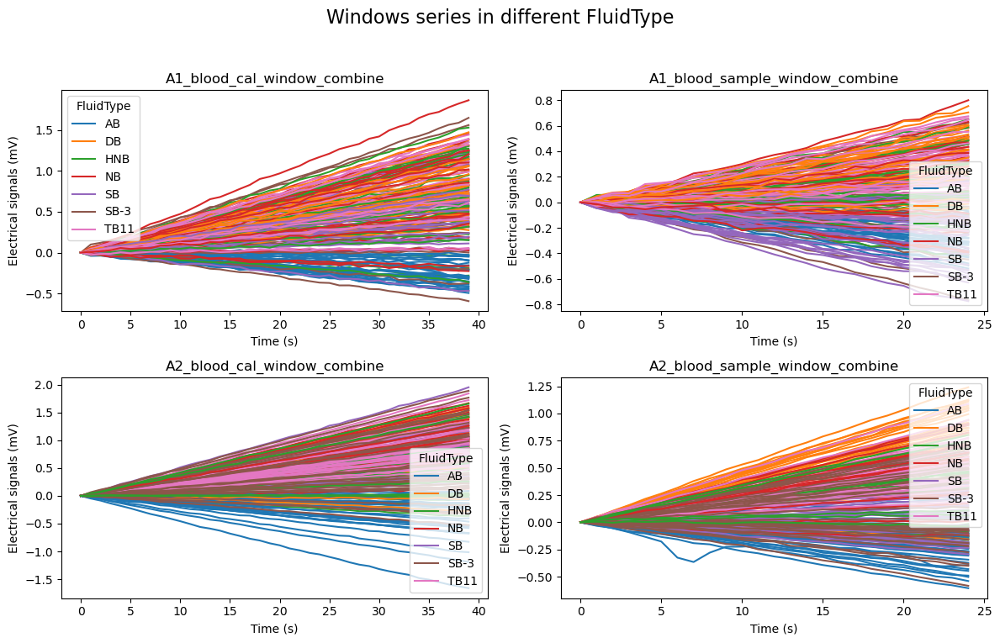

In [23]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(A1_blood_cal_window_combine, A1_blood_sample_window_combine, A2_blood_cal_window_combine, A2_blood_sample_window_combine,"FluidType","A1_blood_cal_window_combine", "A1_blood_sample_window_combine","A2_blood_cal_window_combine", "A2_blood_sample_window_combine")


#### System 1 and System 2: Sensor A - Aqueous - Cal and Sample Windows

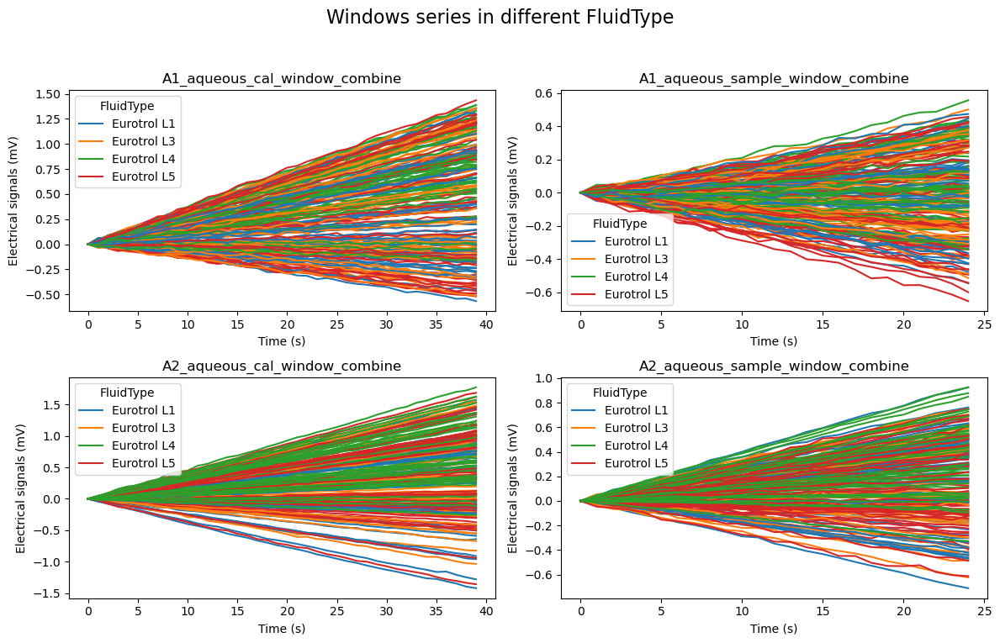

In [24]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(A1_aqueous_cal_window_combine, A1_aqueous_sample_window_combine,A2_aqueous_cal_window_combine, A2_aqueous_sample_window_combine,"FluidType","A1_aqueous_cal_window_combine", "A1_aqueous_sample_window_combine","A2_aqueous_cal_window_combine", "A2_aqueous_sample_window_combine")


#### System 1 and System 2: Sensor B - Blood - Cal and Sample Windows

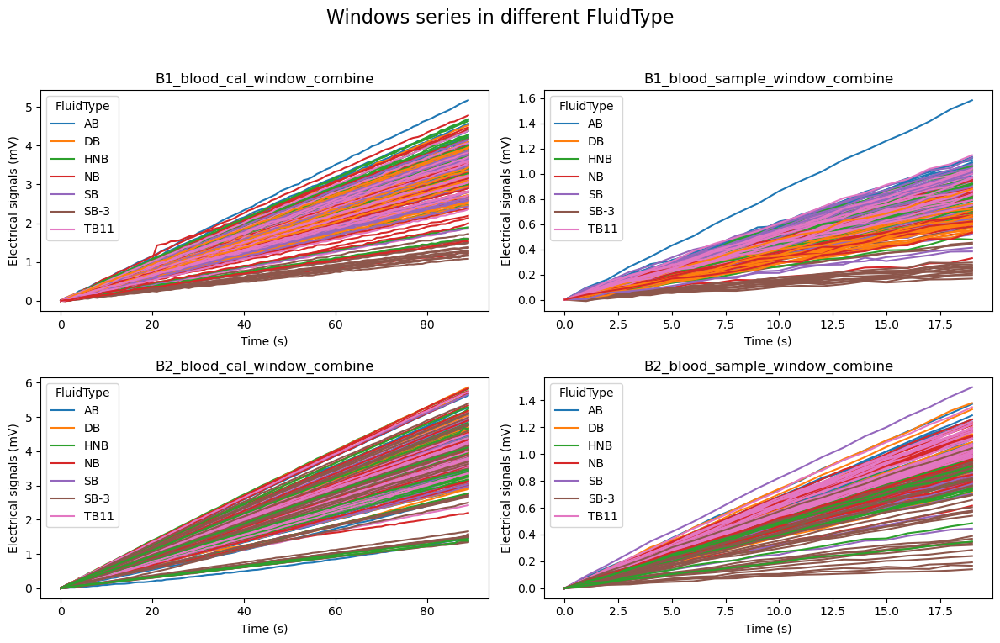

In [25]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(B1_blood_cal_window_combine, B1_blood_sample_window_combine, B2_blood_cal_window_combine, B2_blood_sample_window_combine, "FluidType", "B1_blood_cal_window_combine", "B1_blood_sample_window_combine", "B2_blood_cal_window_combine", "B2_blood_sample_window_combine")


#### System 1 and System 2: Sensor B - Aqueous - Cal and Sample Windows

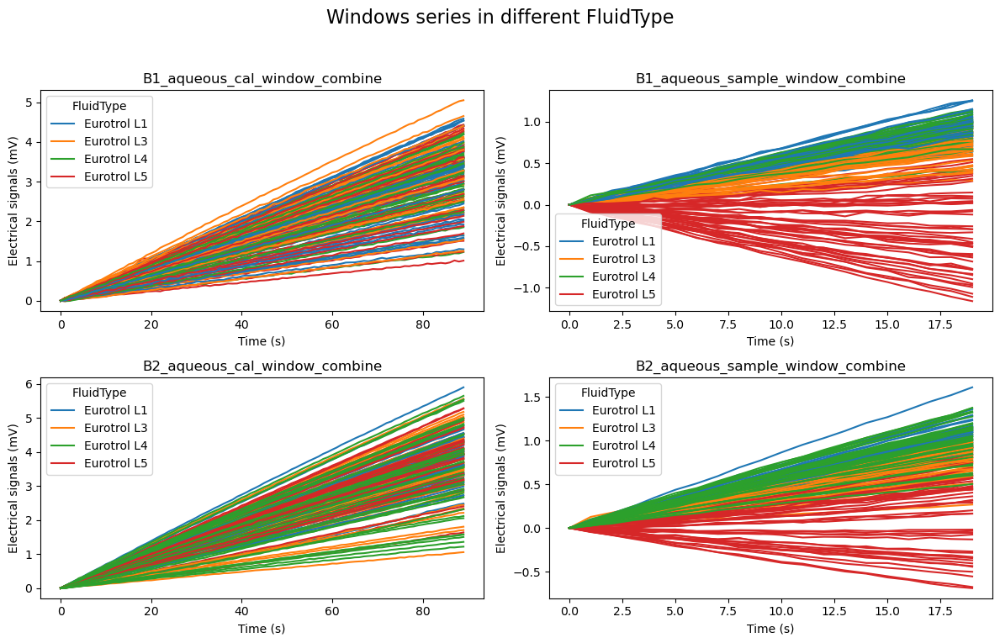

In [26]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(B1_aqueous_cal_window_combine, B1_aqueous_sample_window_combine, B2_aqueous_cal_window_combine, B2_aqueous_sample_window_combine, "FluidType", "B1_aqueous_cal_window_combine", "B1_aqueous_sample_window_combine", "B2_aqueous_cal_window_combine", "B2_aqueous_sample_window_combine")


### 7.2.2 Card Age

#### System 1 and System 2: Sensor A - Blood - Cal and Sample Windows

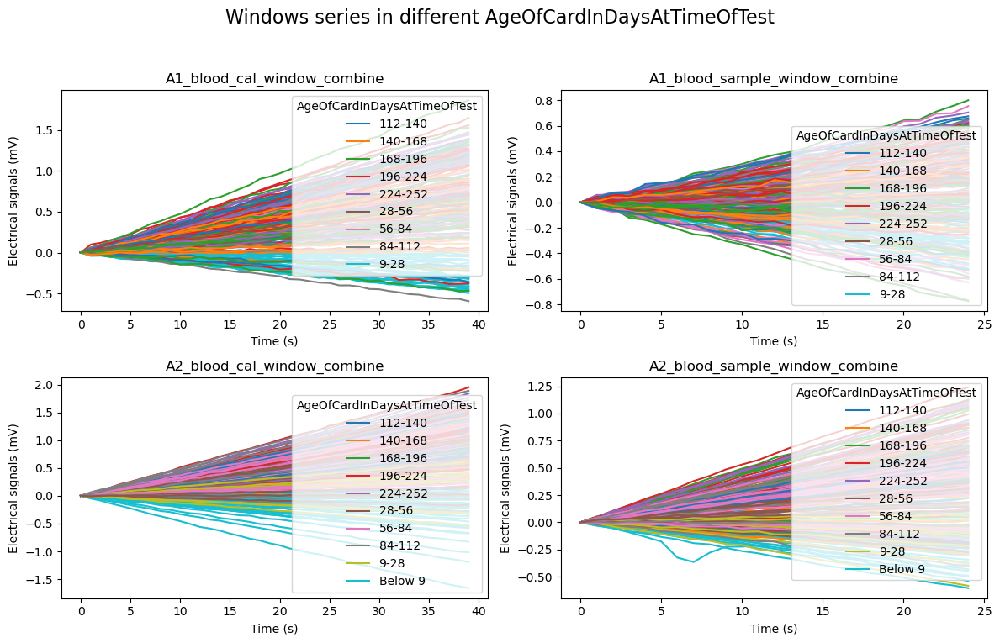

In [27]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(A1_blood_cal_window_combine, A1_blood_sample_window_combine,A2_blood_cal_window_combine, A2_blood_sample_window_combine,"AgeOfCardInDaysAtTimeOfTest","A1_blood_cal_window_combine", "A1_blood_sample_window_combine","A2_blood_cal_window_combine", "A2_blood_sample_window_combine")

#### System 1 and System 2: Sensor A - Aqueous - Cal and Sample Windows

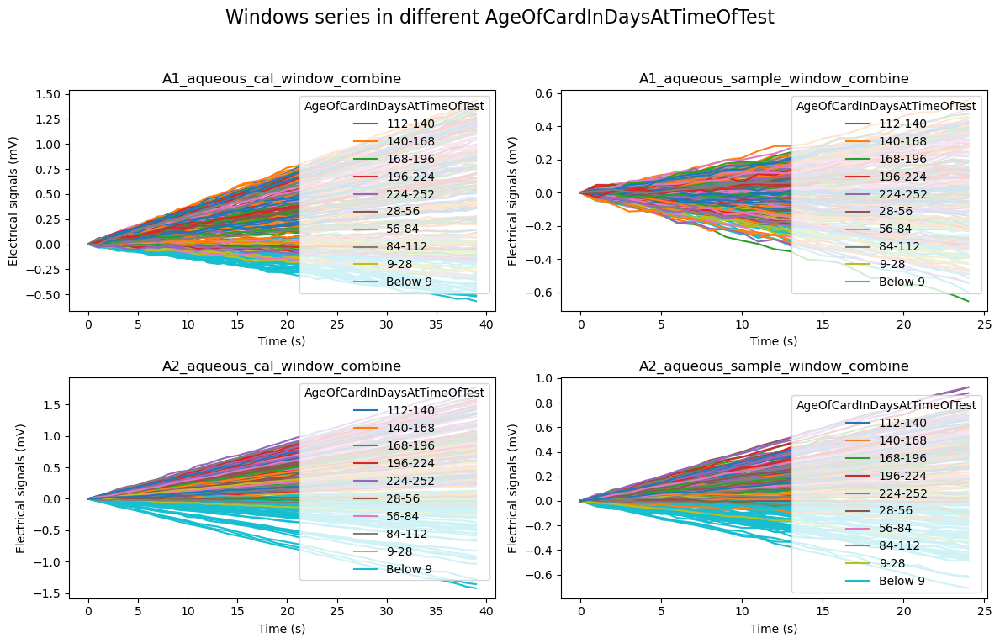

In [28]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(A1_aqueous_cal_window_combine, A1_aqueous_sample_window_combine,A2_aqueous_cal_window_combine, A2_aqueous_sample_window_combine,"AgeOfCardInDaysAtTimeOfTest","A1_aqueous_cal_window_combine", "A1_aqueous_sample_window_combine","A2_aqueous_cal_window_combine", "A2_aqueous_sample_window_combine")


#### System 1 and System 2: Sensor B - Blood - Cal and Sample Windows

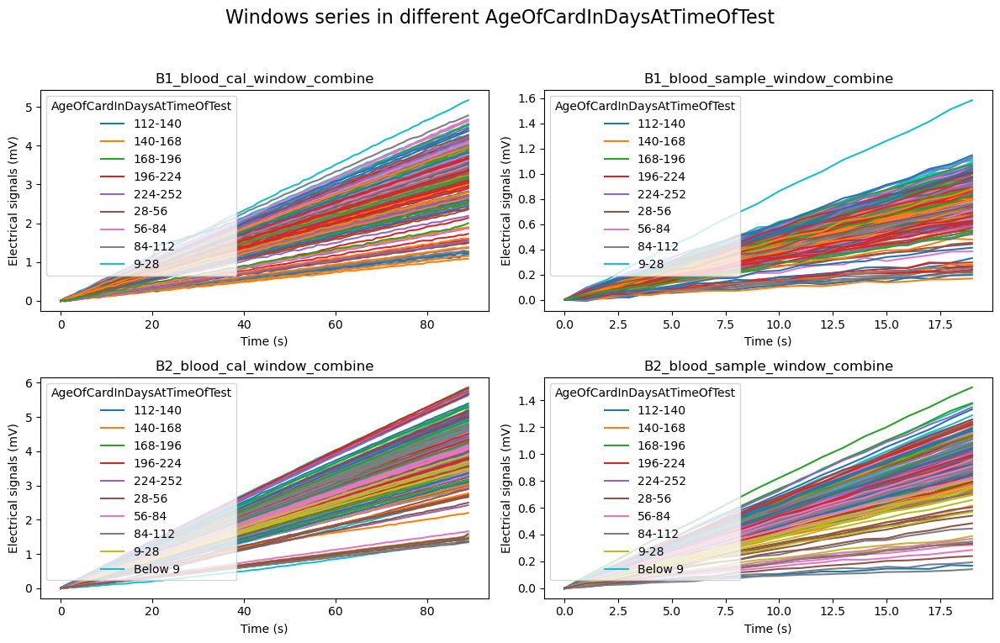

In [29]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(B1_blood_cal_window_combine, B1_blood_sample_window_combine, B2_blood_cal_window_combine, B2_blood_sample_window_combine, "AgeOfCardInDaysAtTimeOfTest", "B1_blood_cal_window_combine", "B1_blood_sample_window_combine", "B2_blood_cal_window_combine", "B2_blood_sample_window_combine")

#### System 1 and System 2: Sensor B - Aqueous - Cal and Sample Windows

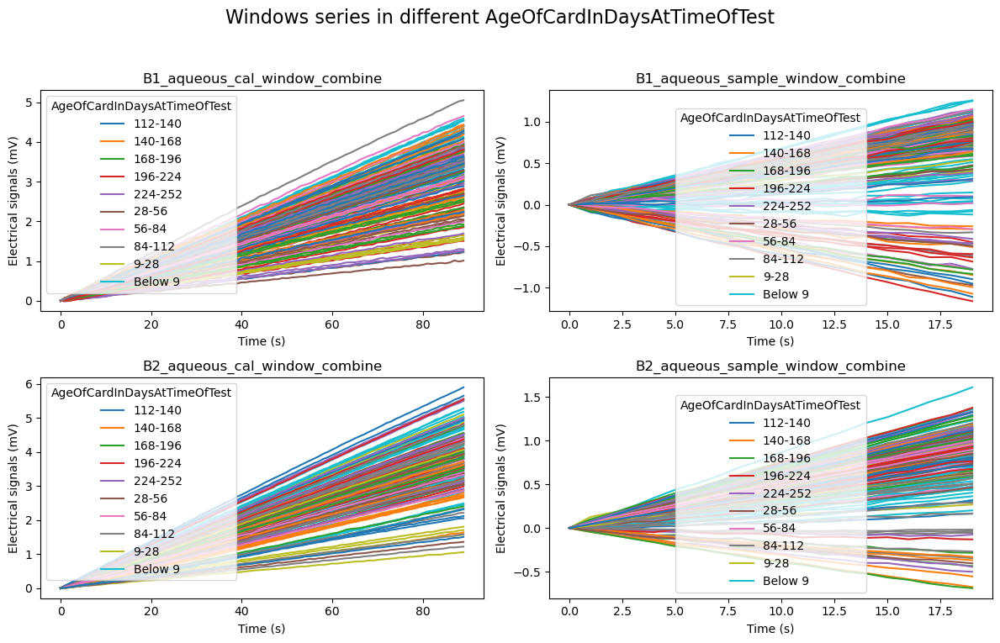

In [30]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(B1_aqueous_cal_window_combine, B1_aqueous_sample_window_combine, B2_aqueous_cal_window_combine, B2_aqueous_sample_window_combine, "AgeOfCardInDaysAtTimeOfTest", "B1_aqueous_cal_window_combine", "B1_aqueous_sample_window_combine", "B2_aqueous_cal_window_combine", "B2_aqueous_sample_window_combine")


### 7.2.3 Temperature

#### System 1 and System 2: Sensor A - Blood - Cal and Sample Windows

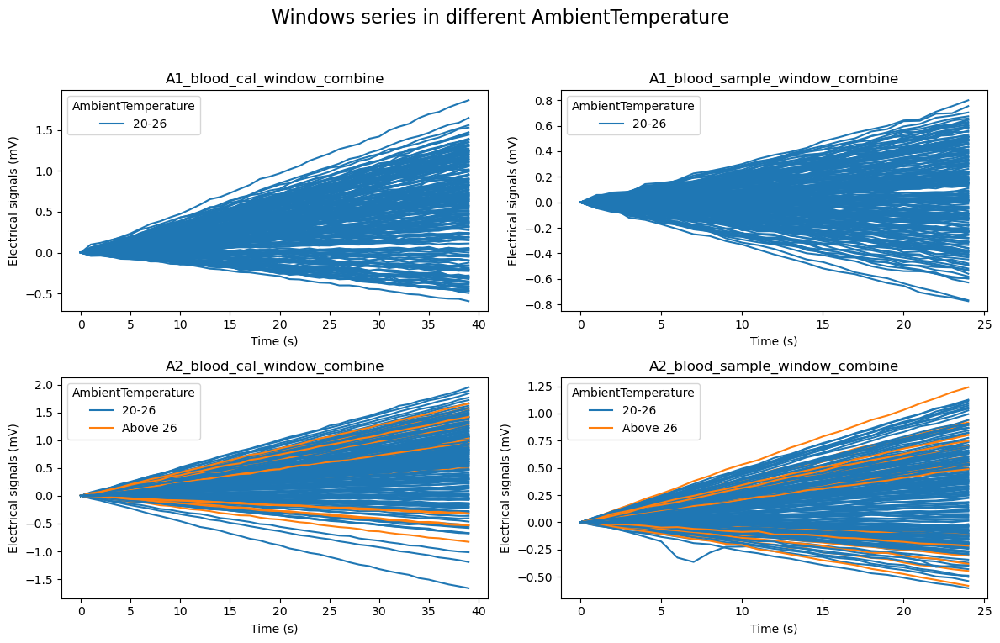

In [31]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(A1_blood_cal_window_combine, A1_blood_sample_window_combine,A2_blood_cal_window_combine, A2_blood_sample_window_combine,"AmbientTemperature","A1_blood_cal_window_combine", "A1_blood_sample_window_combine","A2_blood_cal_window_combine", "A2_blood_sample_window_combine")


#### System 1 and System 2: Sensor A - Aqueous - Cal and Sample Windows

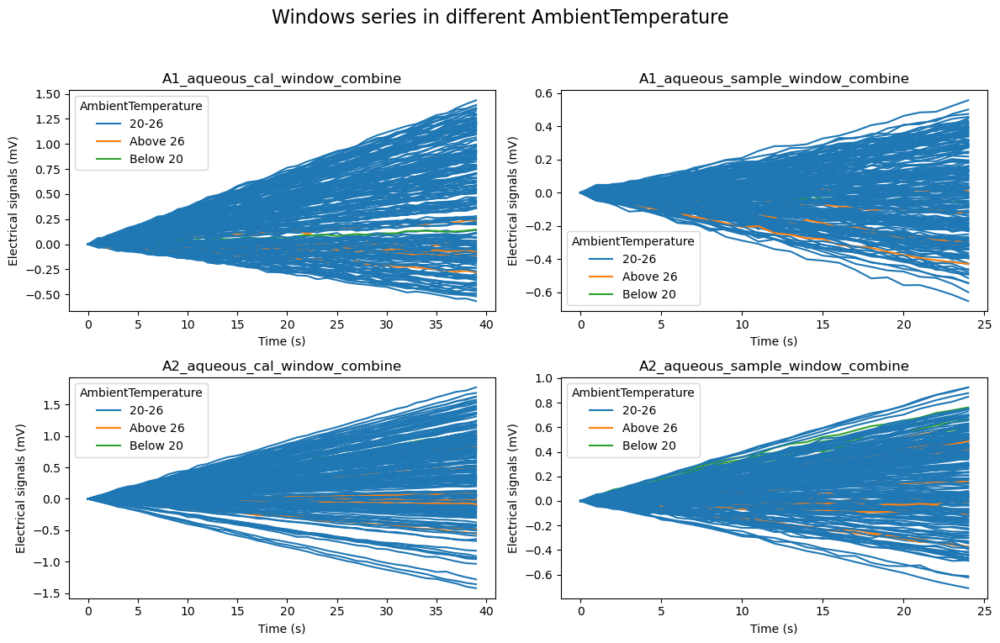

In [32]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(A1_aqueous_cal_window_combine, A1_aqueous_sample_window_combine,A2_aqueous_cal_window_combine, A2_aqueous_sample_window_combine,"AmbientTemperature","A1_aqueous_cal_window_combine", "A1_aqueous_sample_window_combine","A2_aqueous_cal_window_combine", "A2_aqueous_sample_window_combine")


#### System 1 and System 2: Sensor B - Blood - Cal and Sample Windows

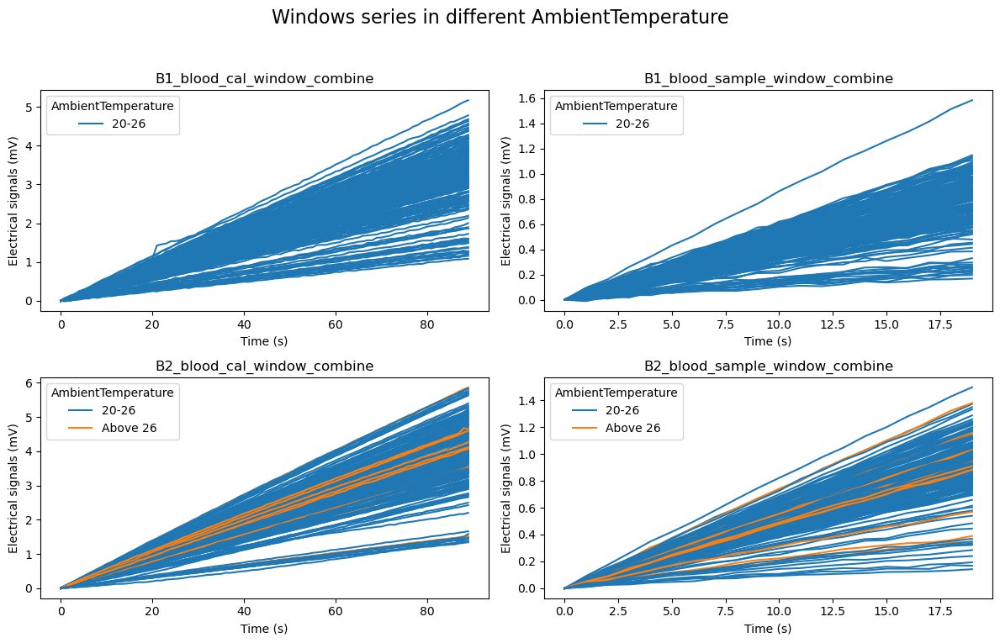

In [33]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(B1_blood_cal_window_combine, B1_blood_sample_window_combine, B2_blood_cal_window_combine, B2_blood_sample_window_combine, "AmbientTemperature", "B1_blood_cal_window_combine", "B1_blood_sample_window_combine", "B2_blood_cal_window_combine", "B2_blood_sample_window_combine")


#### System 1 and System 2: Sensor B - Aqueous - Cal and Sample Windows

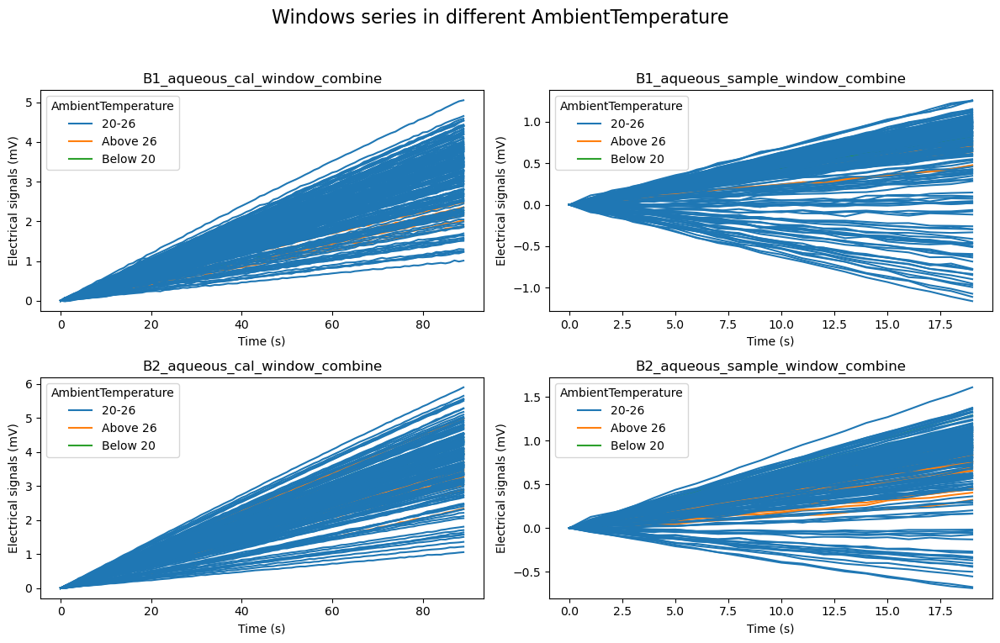

In [34]:
# Plot all the time series from the window extraction
plot_all_time_series_in_group(B1_aqueous_cal_window_combine, B1_aqueous_sample_window_combine, B2_aqueous_cal_window_combine, B2_aqueous_sample_window_combine, "AmbientTemperature", "B1_aqueous_cal_window_combine", "B1_aqueous_sample_window_combine", "B2_aqueous_cal_window_combine", "B2_aqueous_sample_window_combine")


# 8. Functional Principal Components

In [35]:
def perform_functional_pca(data_matrix, y_axis_min=None, y_axis_max=None, color_fpc1=None, color_fpc2=None):
    """
    Performs Functional Principal Component Analysis (FPCA) on a given data matrix and plots the results.

    Parameters:
    data_matrix (pd.DataFrame): A pandas DataFrame where each row represents a time series and each column represents a time point.
    y_axis_min (float, optional): The minimum value for the y-axis in the plots. Defaults to None.
    y_axis_max (float, optional): The maximum value for the y-axis in the plots. Defaults to None.
    color_fpc1 (str, optional): The color for the first functional principal component plot. Defaults to None.
    color_fpc2 (str, optional): The color for the second functional principal component plot. Defaults to None.

    Returns:
    None

    Prints:
    - The explained variance ratio of the first and second functional principal components.
    - The functional principal component scores for each time series.
    - The index and TestID of the time series contributing most to the first and second principal components.

    Plots:
    - The first and second functional principal components.
    - The individual plots of the first and second functional principal components.
    """
    fd = FDataGrid(data_matrix=data_matrix, grid_points=data_matrix.columns.astype(float))

    # Apply Functional PCA
    fpca = FPCA(n_components=2, centering=False)
    fpca.fit(fd)
    pc_scores = fpca.transform(fd)

    # Explain variance ratio
    print('Explain variance FPC1 (%): ', fpca.explained_variance_ratio_[0] * 100)
    print('Explain variance FPC2 (%): ', fpca.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components = fpca.components_

    # Extract loadings for each time point from the first and second principal components
    loadings_pc1 = principal_components.data_matrix[0, :, 0]  # Loadings for the first PC
    loadings_pc2 = principal_components.data_matrix[1, :, 0]  # Loadings for the second PC
    loadings_df = pd.DataFrame({
    'PC1_Loadings': loadings_pc1,
    'PC2_Loadings': loadings_pc2}, index=[f'TimePoint_{i}' for i in range(data_matrix.shape[1])])
    #print("\nLoadings:\n", loadings_df)

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component
    pc_scores_df = pd.DataFrame(pc_scores, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[data_matrix.index[i] for i in range(data_matrix.shape[0])])
    print("FPC Scores:\n", pc_scores_df)

    # Identify which time series (functional data object) contributes the most to each principal component
    max_contribution_index_pc1 = np.argmax(np.abs(pc_scores[:, 0]))  # Index of the maximum absolute score in the first PC
    max_contribution_index_pc2 = np.argmax(np.abs(pc_scores[:, 1]))  # Index of the maximum absolute score in the second PC

    print(f'The time series contributing most to PC1 is at index {max_contribution_index_pc1} with TestID {data_matrix.index[max_contribution_index_pc1]}')
    print(f'The time series contributing most to PC2 is at index {max_contribution_index_pc2} with TestID {data_matrix.index[max_contribution_index_pc2]}')

    # --- Plotting Principal Components ---
    fig, axs = plt.subplots(1, 3, figsize=(12, 3))

    # Both Functional PC's
    axs[0].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), linestyle='-', label='FPC1', color = color_fpc1)
    axs[0].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), linestyle='-', label='FPC2', color = color_fpc2)
   # axs[0].set_title("Functional Principal Components")
    axs[0].set_xlabel('Time (s)')
    axs[0].set_ylabel('Functional PC Values')
    axs[0].legend()
    axs[0].grid(False)
    axs[0].set_ylim(y_axis_min, y_axis_max)

    # FPC1
    axs[1].plot(fpca.components_[0].grid_points[0], fpca.components_[0].data_matrix[0].flatten(), linestyle='-', label='FPC1', color = color_fpc1)
    #axs[1].set_title("Functional Component 1")
    axs[1].set_xlabel('Time (s)')
    axs[1].set_ylabel('')
    axs[1].legend()
    axs[1].grid(False)
    axs[1].set_ylim(y_axis_min, y_axis_max)

    # FPC2
    axs[2].plot(fpca.components_[1].grid_points[0], fpca.components_[1].data_matrix[0].flatten(), linestyle='-', label='FPC2', color = color_fpc2)
    #axs[2].set_title("Functional Component 2")
    axs[2].set_xlabel('Time (s)')
    axs[2].set_ylabel('')
    axs[2].legend()
    axs[2].grid(False)
    axs[2].set_ylim(y_axis_min, y_axis_max)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()
    return fpca

In [36]:
# Note: For the following plots we can adjust the y-axis limit with the parameters y_axis_min and y_axis_max from the function perform_functional_pca().
# If these parameters are not provided then the plots will display the default range, however, we should be aware of this.
# For instance: perform_functional_pca(A1_blood_cal_window, y_axis_min=-0.6, y_axis_max=0.6)

----------------------------------------- Sensor A -----------------------------------------------

## Cal Window

### Cal Window: System 1/2 - Blood

In [37]:
# Running on center data is different than running on raw data
#perform_functional_pca(center_data(A1_blood_cal_window), color_fpc1='tab:blue', color_fpc2='tab:cyan')

Explain variance FPC1 (%):  99.8692571597964
Explain variance FPC2 (%):  0.03459384450940821
FPC Scores:
           PC1_Scores  PC2_Scores
12414382   -0.114097   -0.031471
12431655   -0.675689    0.036724
12431672   -0.762987   -0.005933
12431673   -1.059783    0.016701
12431675   -0.754231   -0.021318
...              ...         ...
12557509    3.255069    0.008024
12573906    2.637789   -0.038645
12539051    0.162549    0.012023
12623129    2.194431   -0.014813
12470354    1.196233   -0.039220

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 92 with TestID 12454406
The time series contributing most to PC2 is at index 25 with TestID 12615989


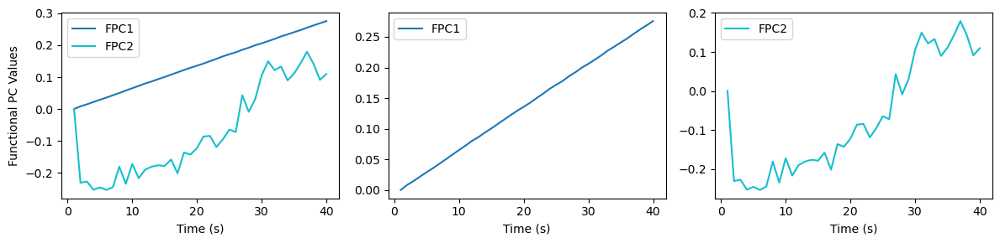

Explain variance FPC1 (%):  99.95814648768784
Explain variance FPC2 (%):  0.014730634147350236
FPC Scores:
          PC1_Scores  PC2_Scores
3545093    0.195775   -0.008537
3545126    0.212977   -0.001852
3545136    0.635434   -0.014234
3545212    0.223051   -0.007644
3545222   -0.139483    0.010324
...             ...         ...
3518658    1.888034   -0.037580
3518659   -0.580759    0.024050
3518660   -1.171198    0.016854
3518691   -0.020201   -0.012657
3518675   -0.071764    0.022114

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 93 with TestID 3547741
The time series contributing most to PC2 is at index 65 with TestID 3561299


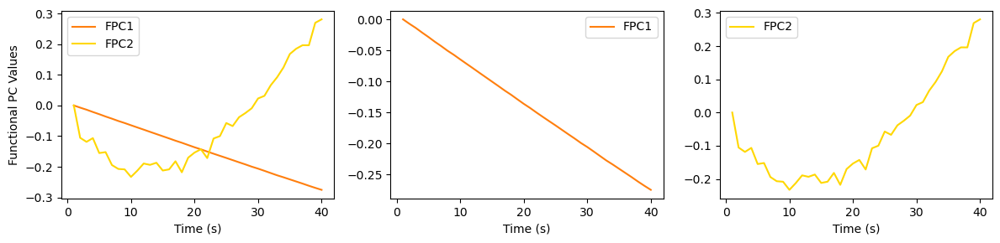

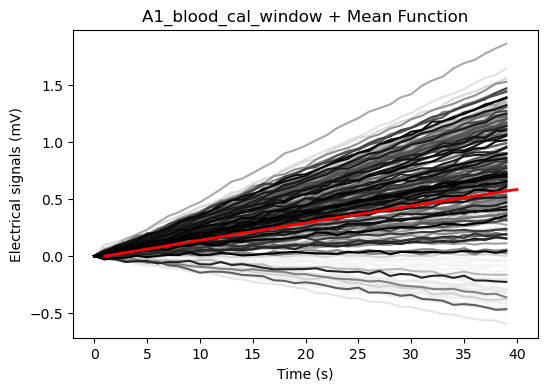

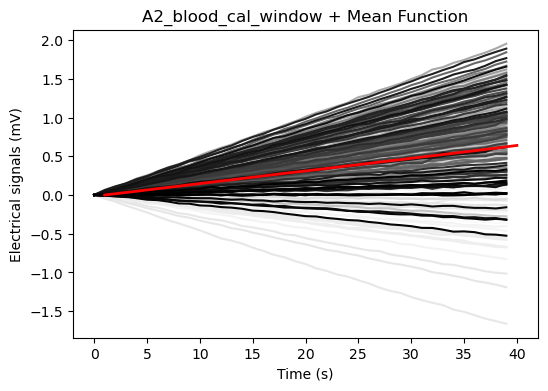

In [38]:
fpca_A1_blood_cal_window = perform_functional_pca(A1_blood_cal_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_A2_blood_cal_window = perform_functional_pca(A2_blood_cal_window_zero, color_fpc1='tab:orange', color_fpc2='gold')
x_A1_blood_cal_window = fpca_A1_blood_cal_window.components_.grid_points
y_A1_blood_cal_window = fpca_A1_blood_cal_window.mean_.data_matrix
x_A2_blood_cal_window = fpca_A2_blood_cal_window.components_.grid_points
y_A2_blood_cal_window = fpca_A2_blood_cal_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(A1_blood_cal_window_zero, 'A1_blood_cal_window + Mean Function', x_A1_blood_cal_window[0], y_A1_blood_cal_window.flatten())
plot_all_time_series_and_mean_fpca(A2_blood_cal_window_zero, 'A2_blood_cal_window + Mean Function', x_A2_blood_cal_window[0], y_A2_blood_cal_window.flatten())

### Cal Window: System 1/2 - aqueous

Explain variance FPC1 (%):  99.87781445766493
Explain variance FPC2 (%):  0.03222334567598707
FPC Scores:
           PC1_Scores  PC2_Scores
12414202   -0.075461    0.016583
12414210    0.137226   -0.065201
12414251    0.000163   -0.044765
12414261   -0.161392    0.008745
12416098   -0.500511    0.003252
...              ...         ...
12624887   -4.400148   -0.012175
12624889   -4.737884    0.007756
12624890   -2.539717   -0.001131
12479777   -2.449028   -0.040246
12537664   -4.075400    0.024065

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 132 with TestID 12574472
The time series contributing most to PC2 is at index 16 with TestID 12509046


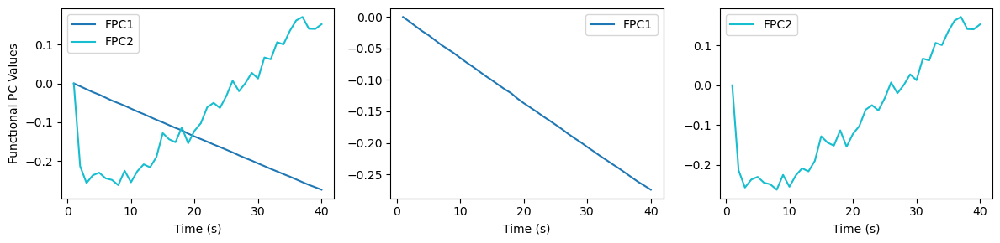

Explain variance FPC1 (%):  99.95534234043755
Explain variance FPC2 (%):  0.01580636239539023
FPC Scores:
          PC1_Scores  PC2_Scores
3551305   -3.491424    0.000790
3551322   -2.621961    0.024513
3551024   -3.405230    0.009317
3551040   -3.232865    0.006412
3551361   -3.122619    0.020289
...             ...         ...
3518396   -1.052235   -0.007929
3518410   -0.132057   -0.001490
3518425    0.921852   -0.017828
3518428    0.397649    0.017907
3518429   -1.313466    0.010979

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 139 with TestID 3556000
The time series contributing most to PC2 is at index 83 with TestID 3562125


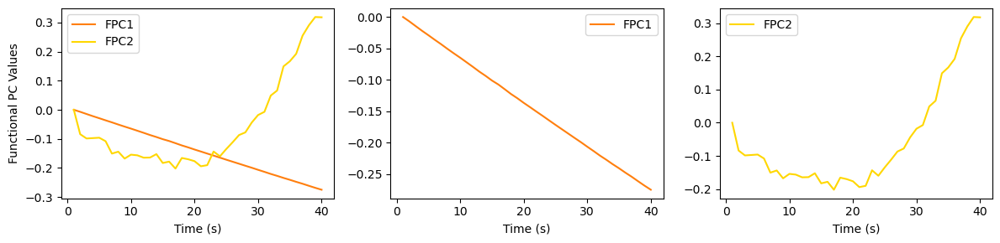

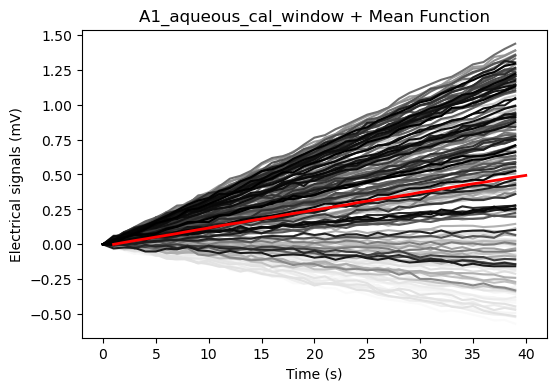

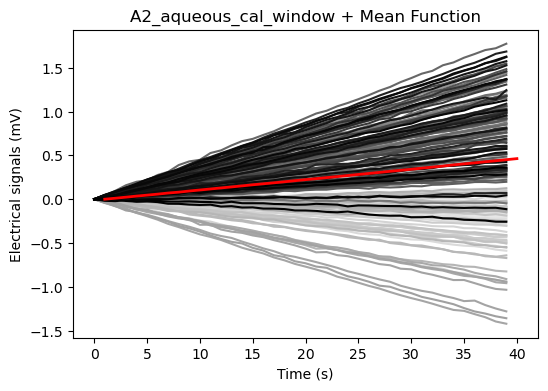

In [39]:
fpca_A1_aqueous_cal_window = perform_functional_pca(A1_aqueous_cal_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_A2_aqueous_cal_window = perform_functional_pca(A2_aqueous_cal_window_zero, color_fpc1='tab:orange', color_fpc2='gold')
x_A1_aqueous_cal_window = fpca_A1_aqueous_cal_window.components_.grid_points
y_A1_aqueous_cal_window = fpca_A1_aqueous_cal_window.mean_.data_matrix
x_A2_aqueous_cal_window = fpca_A2_aqueous_cal_window.components_.grid_points
y_A2_aqueous_cal_window = fpca_A2_aqueous_cal_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(A1_aqueous_cal_window_zero, 'A1_aqueous_cal_window + Mean Function', x_A1_aqueous_cal_window[0], y_A1_aqueous_cal_window.flatten())
plot_all_time_series_and_mean_fpca(A2_aqueous_cal_window_zero, 'A2_aqueous_cal_window + Mean Function', x_A2_aqueous_cal_window[0], y_A2_aqueous_cal_window.flatten())

## Sample Window

### Sample Window: System 1/2 - Blood

Explain variance FPC1 (%):  99.67490316719156
Explain variance FPC2 (%):  0.10332793024052093
FPC Scores:
           PC1_Scores  PC2_Scores
12414382    0.681754   -0.035109
12431655    0.486409    0.006713
12431672    0.454730    0.034720
12431673    0.642255    0.015615
12431675    0.630490   -0.061816
...              ...         ...
12557509   -0.927461   -0.043683
12573906    1.573204   -0.090215
12539051    0.661650   -0.026028
12623129   -0.549868   -0.026086
12470354    0.276107   -0.063862

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 147 with TestID 12434569
The time series contributing most to PC2 is at index 188 with TestID 12481009


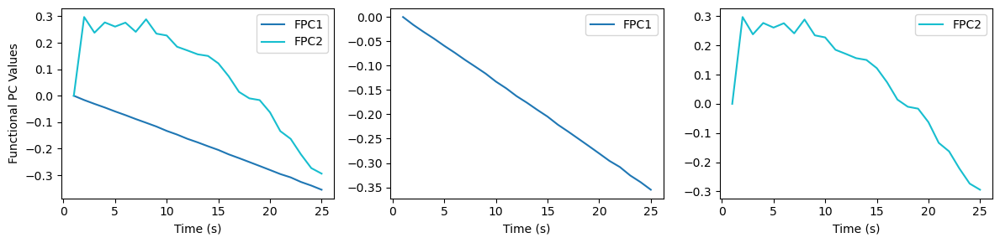

Explain variance FPC1 (%):  99.880186519481
Explain variance FPC2 (%):  0.06738130232571374
FPC Scores:
          PC1_Scores  PC2_Scores
3545093   -0.284602   -0.020507
3545126   -0.342758   -0.018289
3545136   -0.546575   -0.014703
3545212   -0.374147    0.000926
3545222   -0.197926   -0.015085
...             ...         ...
3518658   -1.591488   -0.053364
3518659   -0.044468   -0.027352
3518660   -0.191238   -0.018304
3518691   -0.070007   -0.026992
3518675    0.339699   -0.045398

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 49 with TestID 3569418
The time series contributing most to PC2 is at index 27 with TestID 3561848


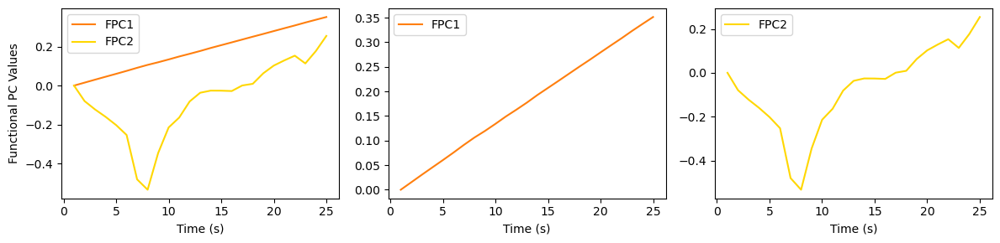

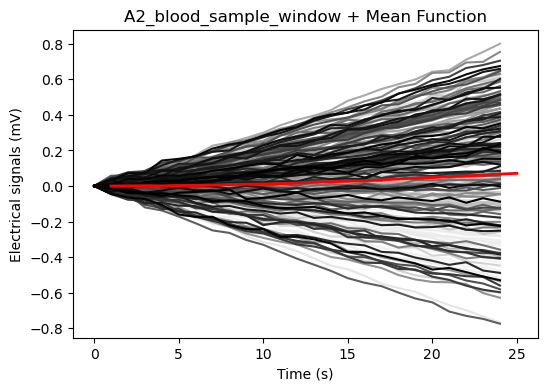

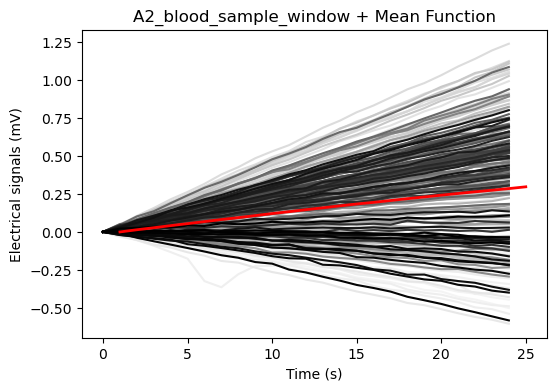

In [40]:
fpca_A1_blood_sample_window = perform_functional_pca(A1_blood_sample_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_A2_blood_sample_window = perform_functional_pca(A2_blood_sample_window_zero, color_fpc1='tab:orange', color_fpc2='gold')
x_A1_blood_sample_window = fpca_A1_blood_sample_window.components_.grid_points
y_A1_blood_sample_window = fpca_A1_blood_sample_window.mean_.data_matrix
x_A2_blood_sample_window = fpca_A2_blood_sample_window.components_.grid_points
y_A2_blood_sample_window = fpca_A2_blood_sample_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(A1_blood_sample_window_zero, 'A2_blood_sample_window + Mean Function', x_A1_blood_sample_window[0], y_A1_blood_sample_window.flatten())
plot_all_time_series_and_mean_fpca(A2_blood_sample_window_zero, 'A2_blood_sample_window + Mean Function', x_A2_blood_sample_window[0], y_A2_blood_sample_window.flatten())

### Sample Window: System 1/2 - Aqueous

Explain variance FPC1 (%):  99.39174250730987
Explain variance FPC2 (%):  0.186845146214196
FPC Scores:
           PC1_Scores  PC2_Scores
12414202    0.249426    0.022477
12414210    0.551379   -0.036814
12414251    0.915371   -0.006639
12414261    0.590776   -0.007471
12416098   -0.134917    0.036479
...              ...         ...
12624887   -1.114535   -0.061941
12624889   -1.132633   -0.018262
12624890   -0.473451   -0.083762
12479777   -0.361071   -0.063182
12537664   -0.335604   -0.022729

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 165 with TestID 12472598
The time series contributing most to PC2 is at index 166 with TestID 12513384


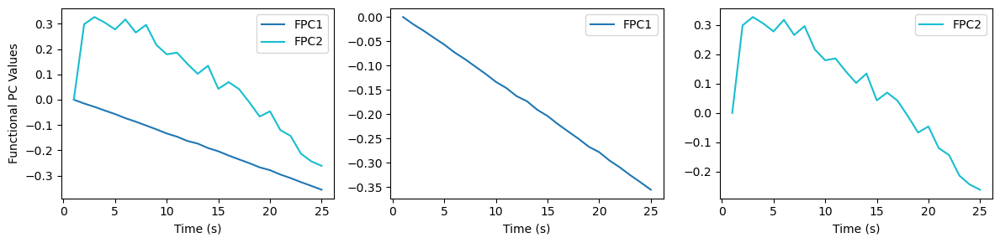

Explain variance FPC1 (%):  99.80038701471759
Explain variance FPC2 (%):  0.0644108155643499
FPC Scores:
          PC1_Scores    PC2_Scores
3551305   -1.203978  2.674685e-02
3551322   -1.056997  5.386313e-02
3551024   -1.497861  4.365841e-02
3551040   -1.300479  5.413684e-02
3551361   -1.252230  2.297563e-02
...             ...           ...
3518396   -0.200031  1.621059e-02
3518410    0.012301  7.111970e-03
3518425    0.922487  2.327262e-02
3518428    0.180134  1.817798e-02
3518429   -0.757321 -4.881926e-07

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 108 with TestID 3569179
The time series contributing most to PC2 is at index 21 with TestID 3561406


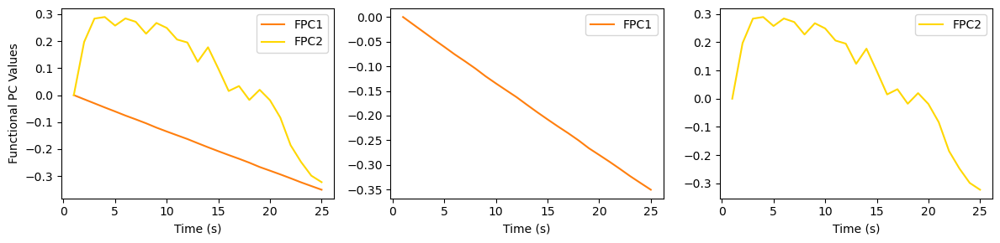

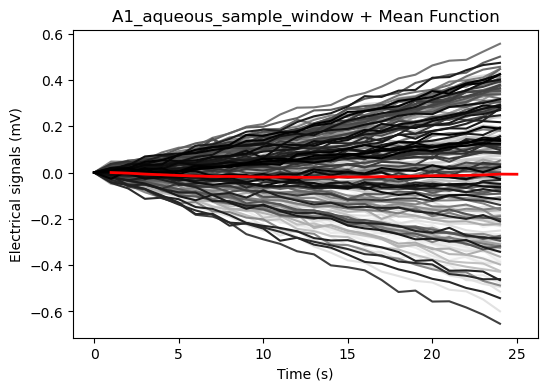

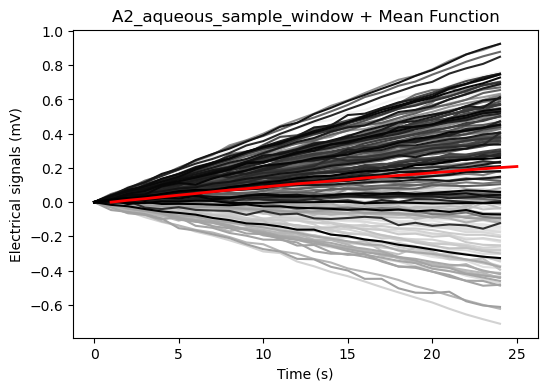

In [41]:
fpca_A1_aqueous_sample_window = perform_functional_pca(A1_aqueous_sample_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_A2_aqueous_sample_window = perform_functional_pca(A2_aqueous_sample_window_zero, color_fpc1='tab:orange', color_fpc2='gold')
x_A1_aqueous_sample_window = fpca_A1_aqueous_sample_window.components_.grid_points
y_A1_aqueous_sample_window = fpca_A1_aqueous_sample_window.mean_.data_matrix
x_A2_aqueous_sample_window = fpca_A2_aqueous_sample_window.components_.grid_points
y_A2_aqueous_sample_window = fpca_A2_aqueous_sample_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(A1_aqueous_sample_window_zero, 'A1_aqueous_sample_window + Mean Function', x_A1_aqueous_sample_window[0], y_A1_aqueous_sample_window.flatten())
plot_all_time_series_and_mean_fpca(A2_aqueous_sample_window_zero, 'A2_aqueous_sample_window + Mean Function', x_A2_aqueous_sample_window[0], y_A2_aqueous_sample_window.flatten())

------------------------------------- Sensor B ------------------------------------------------

## Cal Window

### Cal Window:  System 1/2 - Blood

Explain variance FPC1 (%):  99.80074865792018
Explain variance FPC2 (%):  0.13599448191605304
FPC Scores:
           PC1_Scores  PC2_Scores
12414382  -25.726479   -0.061622
12431655  -19.425260    0.072628
12431672  -21.448660   -0.084527
12431673  -20.166443    0.040007
12431675  -21.613061   -0.072279
...              ...         ...
12557509  -22.002999   -0.149629
12573906  -13.487028   -0.077066
12539051  -15.575948   -0.127006
12623129  -12.816956    0.044349
12470354  -10.730551   -0.021429

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 20 with TestID 12601179
The time series contributing most to PC2 is at index 25 with TestID 12615989


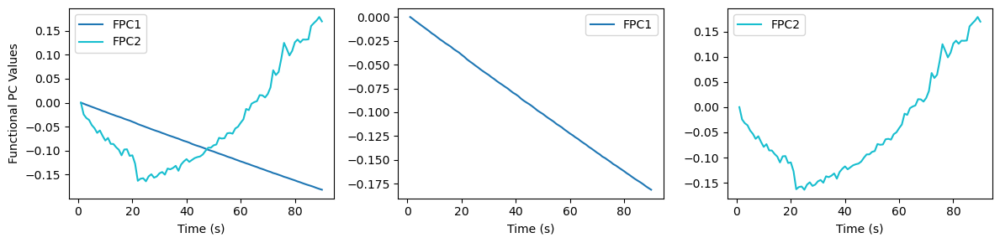

Explain variance FPC1 (%):  99.89884570165515
Explain variance FPC2 (%):  0.07437346616467935
FPC Scores:
          PC1_Scores  PC2_Scores
3545093  -28.223436   -0.090619
3545126  -25.750978   -0.191042
3545136  -27.865055   -0.184956
3545212  -25.335157   -0.263547
3545222  -26.883842   -0.248851
...             ...         ...
3518658   -8.244266   -0.163810
3518659   -8.235632   -0.111542
3518660   -9.052051   -0.134199
3518691   -7.462467   -0.123165
3518675   -7.846263   -0.112280

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 6 with TestID 3545269
The time series contributing most to PC2 is at index 37 with TestID 3568595


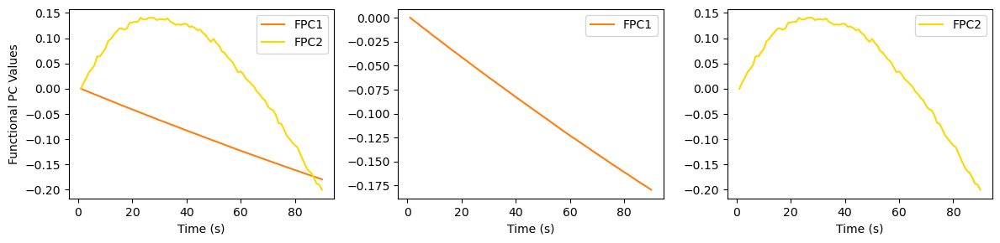

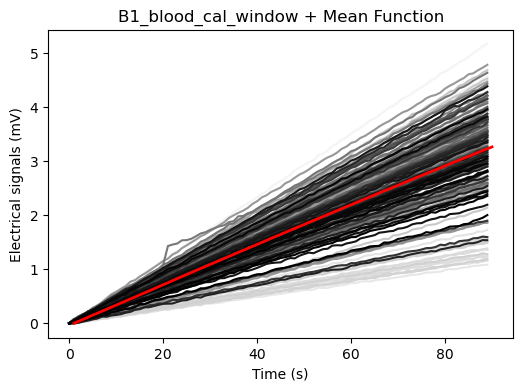

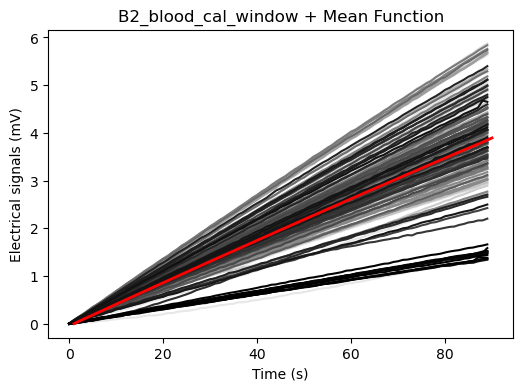

In [42]:
fpca_B1_blood_cal_window = perform_functional_pca(B1_blood_cal_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_B2_blood_cal_window = perform_functional_pca(B2_blood_cal_window_zero, color_fpc1='tab:orange', color_fpc2='gold')
x_B1_blood_cal_window = fpca_B1_blood_cal_window.components_.grid_points
y_B1_blood_cal_window = fpca_B1_blood_cal_window.mean_.data_matrix
x_B2_blood_cal_window = fpca_B2_blood_cal_window.components_.grid_points
y_B2_blood_cal_window = fpca_B2_blood_cal_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(B1_blood_cal_window_zero, 'B1_blood_cal_window + Mean Function', x_B1_blood_cal_window[0], y_B1_blood_cal_window.flatten())
plot_all_time_series_and_mean_fpca(B2_blood_cal_window_zero, 'B2_blood_cal_window + Mean Function', x_B2_blood_cal_window[0], y_B2_blood_cal_window.flatten())

### Cal Window:  System 1/2 - Aqueous

Explain variance FPC1 (%):  99.83154647821614
Explain variance FPC2 (%):  0.10454363089998688
FPC Scores:
           PC1_Scores  PC2_Scores
12414202  -24.215929   -0.089006
12414210  -21.144266   -0.024468
12414251  -25.043212   -0.012836
12414261  -25.220077   -0.098258
12416098  -23.140291   -0.088263
...              ...         ...
12624887  -23.330743   -0.130556
12624889  -19.940793    0.015639
12624890  -11.723547   -0.053283
12479777  -15.313654   -0.118323
12537664  -21.315490   -0.090892

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 143 with TestID 12417705
The time series contributing most to PC2 is at index 38 with TestID 12601998


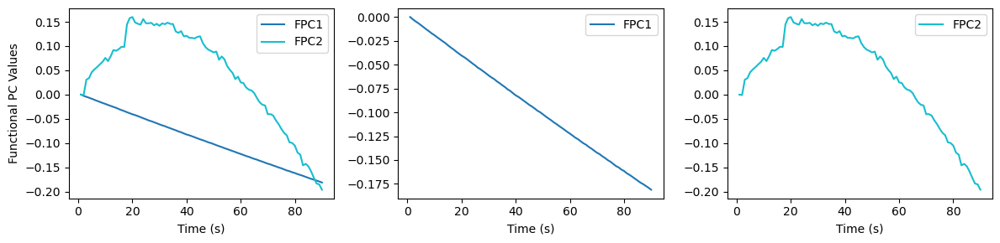

Explain variance FPC1 (%):  99.87719328222387
Explain variance FPC2 (%):  0.09854556555544167
FPC Scores:
          PC1_Scores  PC2_Scores
3551305  -21.833798    0.133348
3551322  -22.054127    0.437963
3551024  -18.227256    0.294505
3551040  -21.769453    0.236265
3551361  -17.564862    0.222125
...             ...         ...
3518396   -6.704668    0.149110
3518410   -7.443738    0.190949
3518425   -8.676680    0.198318
3518428   -8.621058    0.192634
3518429   -8.210960    0.171466

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 99 with TestID 3552587
The time series contributing most to PC2 is at index 96 with TestID 3568510


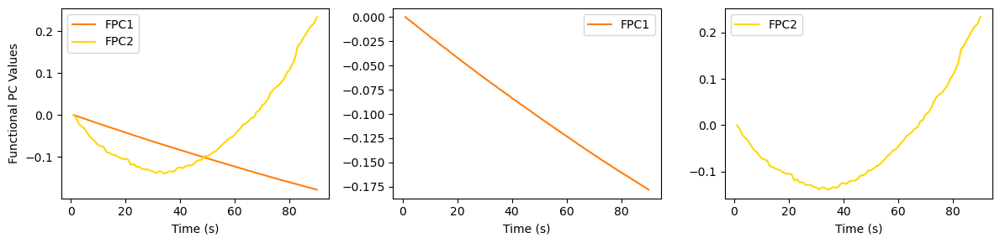

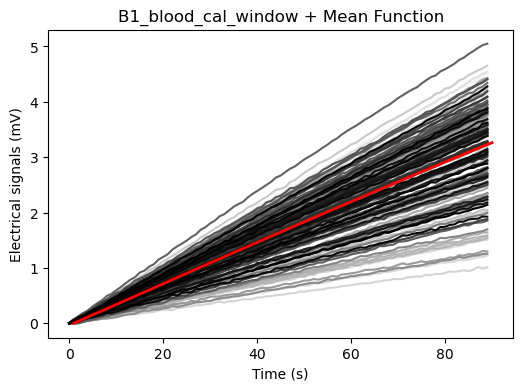

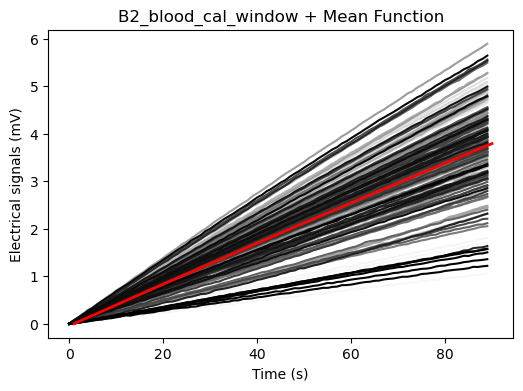

In [43]:
fpca_B1_aqueous_cal_window = perform_functional_pca(B1_aqueous_cal_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_B2_aqueous_cal_window= perform_functional_pca(B2_aqueous_cal_window_zero, color_fpc1='tab:orange', color_fpc2='gold')
x_B1_aqueous_cal_window = fpca_B1_aqueous_cal_window.components_.grid_points
y_B1_aqueous_cal_window = fpca_B1_aqueous_cal_window.mean_.data_matrix
x_B2_aqueous_cal_window = fpca_B2_aqueous_cal_window.components_.grid_points
y_B2_aqueous_cal_window = fpca_B2_aqueous_cal_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(B1_aqueous_cal_window_zero, 'B1_blood_cal_window + Mean Function', x_B1_aqueous_cal_window[0], y_B1_blood_cal_window.flatten())
plot_all_time_series_and_mean_fpca(B2_aqueous_cal_window_zero, 'B2_blood_cal_window + Mean Function', x_B2_aqueous_cal_window[0], y_B2_aqueous_cal_window.flatten())

## Sample window

### Sample Window:  System 1/2 - Blood

Explain variance FPC1 (%):  99.2766297832728
Explain variance FPC2 (%):  0.20831340652574565
FPC Scores:
           PC1_Scores  PC2_Scores
12414382    2.420050   -0.000743
12431655    1.913228   -0.022815
12431672    1.936825    0.017043
12431673    1.978875   -0.017322
12431675    2.204807   -0.002418
...              ...         ...
12557509    2.218154    0.005276
12573906    1.077592   -0.000423
12539051    2.019372   -0.033584
12623129    1.956382   -0.059472
12470354    1.345047   -0.032838

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 20 with TestID 12601179
The time series contributing most to PC2 is at index 76 with TestID 12434712


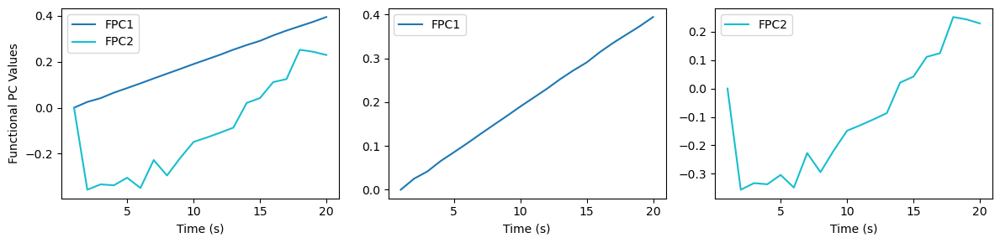

Explain variance FPC1 (%):  99.78528724454027
Explain variance FPC2 (%):  0.07837636708191101
FPC Scores:
          PC1_Scores  PC2_Scores
3545093   -2.762368    0.033379
3545126   -2.748878    0.003697
3545136   -2.792629    0.023445
3545212   -2.550842    0.046167
3545222   -2.690397    0.029692
...             ...         ...
3518658   -0.930936    0.030935
3518659   -0.888936    0.025949
3518660   -0.963970    0.036475
3518691   -0.901278    0.029190
3518675   -1.236870    0.030452

[210 rows x 2 columns]
The time series contributing most to PC1 is at index 76 with TestID 3547717
The time series contributing most to PC2 is at index 113 with TestID 3563475


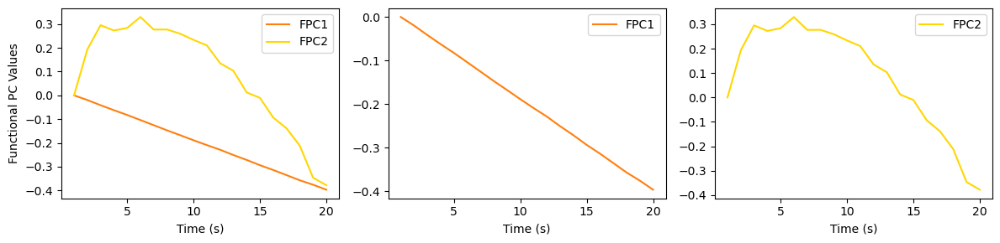

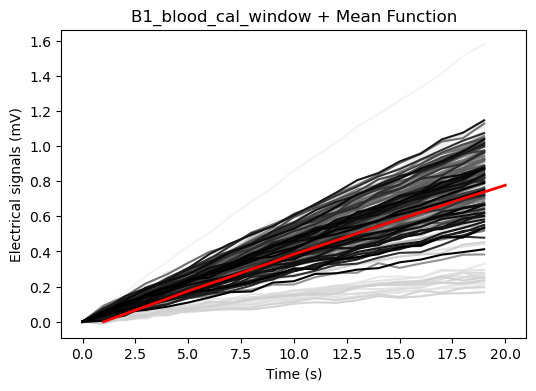

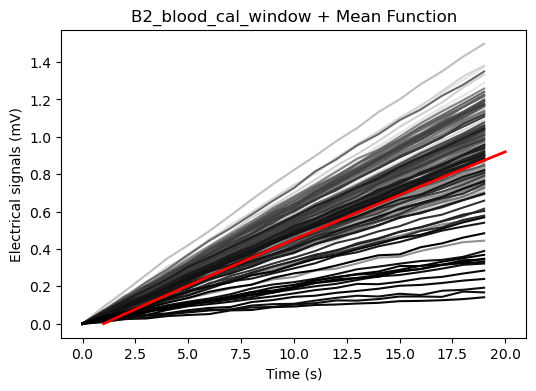

In [44]:
fpca_B1_blood_sample_window = perform_functional_pca(B1_blood_sample_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_B2_blood_sample_window = perform_functional_pca(B2_blood_sample_window_zero, color_fpc1='tab:orange', color_fpc2='gold')
x_B1_blood_sample_window = fpca_B1_blood_sample_window.components_.grid_points
y_B1_blood_sample_window = fpca_B1_blood_sample_window.mean_.data_matrix
x_B2_blood_sample_window = fpca_B2_blood_sample_window.components_.grid_points
y_B2_blood_sample_window = fpca_B2_blood_sample_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(B1_blood_sample_window_zero, 'B1_blood_cal_window + Mean Function', x_B1_blood_sample_window[0], y_B1_blood_sample_window.flatten())
plot_all_time_series_and_mean_fpca(B2_blood_sample_window_zero, 'B2_blood_cal_window + Mean Function', x_B2_blood_sample_window[0], y_B2_blood_sample_window.flatten())

### Sample Window:  System 1/2 - Aqueous

Explain variance FPC1 (%):  99.87053811175977
Explain variance FPC2 (%):  0.03901658831114739
FPC Scores:
           PC1_Scores  PC2_Scores
12414202   -2.226356    0.051024
12414210   -2.070648    0.018207
12414251   -2.699657   -0.005103
12414261   -2.857082    0.036636
12416098   -1.371712    0.017534
...              ...         ...
12624887   -0.704038    0.081389
12624889   -0.164130    0.036481
12624890    1.329670    0.042054
12479777   -2.588909    0.001080
12537664   -2.391732    0.000910

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 44 with TestID 12634794
The time series contributing most to PC2 is at index 15 with TestID 12509534


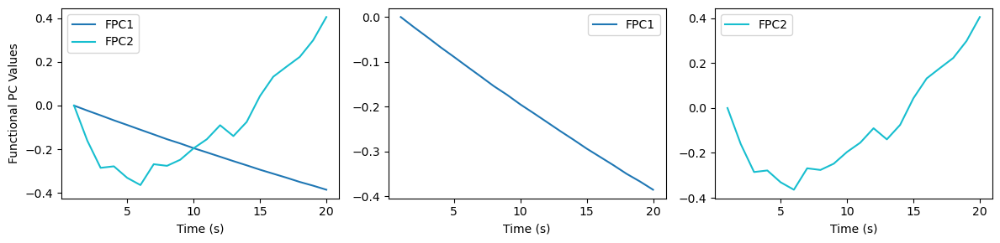

Explain variance FPC1 (%):  99.8807233641277
Explain variance FPC2 (%):  0.05382309881479746
FPC Scores:
          PC1_Scores  PC2_Scores
3551305   -2.065010   -0.006998
3551322   -2.328803    0.061687
3551024   -2.440914    0.042172
3551040   -2.583433    0.042059
3551361   -1.765585    0.020552
...             ...         ...
3518396   -1.306771    0.001303
3518410   -1.605888    0.025877
3518425   -1.579286    0.015524
3518428   -1.562335    0.009251
3518429   -1.870274   -0.000201

[208 rows x 2 columns]
The time series contributing most to PC1 is at index 90 with TestID 3566835
The time series contributing most to PC2 is at index 87 with TestID 3566598


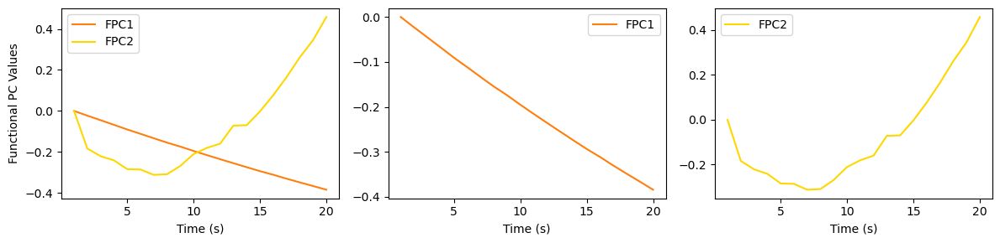

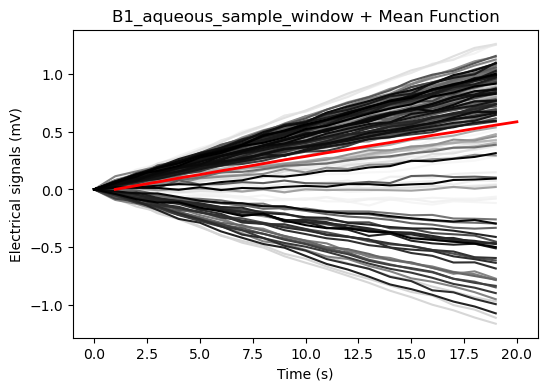

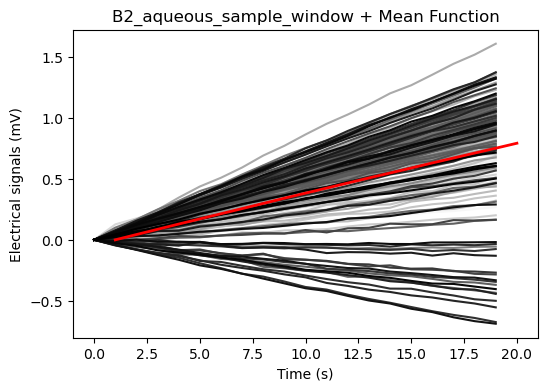

In [45]:
fpca_B1_aqueous_sample_window = perform_functional_pca(B1_aqueous_sample_window_zero, color_fpc1='tab:blue', color_fpc2='tab:cyan')
fpca_B2_aqueous_sample_window = perform_functional_pca(B2_aqueous_sample_window_zero, color_fpc1='tab:orange', color_fpc2='gold')

x_B1_aqueous_sample_window = fpca_B1_aqueous_sample_window.components_.grid_points
y_B1_aqueous_sample_window = fpca_B1_aqueous_sample_window.mean_.data_matrix
x_B2_aqueous_sample_window = fpca_B2_aqueous_sample_window.components_.grid_points
y_B2_aqueous_sample_window = fpca_B2_aqueous_sample_window.mean_.data_matrix

plot_all_time_series_and_mean_fpca(B1_aqueous_sample_window_zero, 'B1_aqueous_sample_window + Mean Function', x_B1_aqueous_sample_window[0], y_B1_aqueous_sample_window.flatten())
plot_all_time_series_and_mean_fpca(B2_aqueous_sample_window_zero,'B2_aqueous_sample_window + Mean Function', x_B2_aqueous_sample_window[0], y_B2_aqueous_sample_window.flatten())

# 8 FPCA

## 8.1. Functional PCA characterization function

In [46]:
def fpca_two_inputs(time_series_s1, time_series_s2, y_axis_min=None, y_axis_max=None):
    """
    Performs Functional Principal Component Analysis (FPCA) on two sets of time series data from different systems
    and plots the first principal component for both systems on the same graph.

    Parameters:
    time_series_s1 (pd.DataFrame): A pandas DataFrame representing time series data from System 1. Each row represents
                                   a time series and each column represents a time point.
    time_series_s2 (pd.DataFrame): A pandas DataFrame representing time series data from System 2. Each row represents
                                   a time series and each column represents a time point.
    y_axis_min (float, optional): The minimum value for the y-axis in the plot. Defaults to None.
    y_axis_max (float, optional): The maximum value for the y-axis in the plot. Defaults to None.

    Returns:
    tuple: A tuple containing two pandas DataFrames representing the functional principal component scores for System 1
           and System 2 respectively.

    Prints:
    - The explained variance ratio of the first principal component for both systems.
    - The functional principal component scores for each time series in both systems.
    - Plots the first principal component for both systems on the same graph.

    """
    # Convert the data matrix to an FDataGrid object
    fd_s1 = FDataGrid(data_matrix=time_series_s1, grid_points=time_series_s1.columns.astype(float)) # System 1
    fd_s2 = FDataGrid(data_matrix=time_series_s2, grid_points=time_series_s2.columns.astype(float)) # System 2

    # Apply Functional PCA for System 1
    fpca_s1 = FPCA(n_components=2, centering=True)
    fpca_s1.fit(fd_s1)
    fpc_and_scores_s1 = fpca_s1.transform(fd_s1)

    # Apply Functional PCA for System 2
    fpca_s2 = FPCA(n_components=2)
    fpca_s2.fit(fd_s2)
    fpc_and_scores_s2 = fpca_s2.transform(fd_s2)

    # --- Explain variance ratio ---
    # System 1
    print('S1 Explain variance FPC1 (%): ', fpca_s1.explained_variance_ratio_[0] * 100)
    #print('S1 Explain variance PC2 (%): ', fpca_s1.explained_variance_ratio_[1] * 100)
    # System 2
    print('S2 Explain variance FPC1 (%): ', fpca_s2.explained_variance_ratio_[0] * 100)
    #print('S2 Explain variance PC2 (%): ', fpca_s2.explained_variance_ratio_[1] * 100)

    # --- Loadings ---
    # Extract the principal components (loadings)
    principal_components_s1 = fpca_s1.components_ # System 1
    principal_components_s2 = fpca_s2.components_ # System 2

    # --- Scores ---
    # Print the scores to see contributions of each time series to each principal component

    # System 1
    pc_scores_s1 = pd.DataFrame(fpc_and_scores_s1, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s1.index[i] for i in range(time_series_s1.shape[0])])
    # System 2
    pc_scores_s2 = pd.DataFrame(fpc_and_scores_s2, columns=['PC1_Scores', 'PC2_Scores'],
                                index=[time_series_s2.index[i] for i in range(time_series_s2.shape[0])])

    # --- Plotting First Principal Component for both Systems ---
    # Extracting data for System 1
    x1 = fpca_s1.components_[0].grid_points[0]
    y1 = fpca_s1.components_[0].data_matrix[0].flatten()

    # Extracting data for System 2
    x2 = fpca_s2.components_[0].grid_points[0]
    y2 = fpca_s2.components_[0].data_matrix[0].flatten()

    # Plotting both curves in the same graph
    fig = plt.figure(figsize=(5, 3))
    plt.plot(x1, y1, linestyle='-', label='FPC1 - System 1')
    plt.plot(x2, y2, linestyle='-', label='FPC1 - System 2')

    plt.legend()
    plt.grid(False)
    plt.xlabel('Time (s)')
    plt.ylabel('Functional PC1 Values')
    #plt.title('System 1 versus System 2')
    plt.ylim(y_axis_min, y_axis_max)
    plt.show()

    return pc_scores_s1, pc_scores_s2,fpca_s1.components_[0],fpca_s2.components_[0]

In [47]:
def create_pc_scores_plots(pc_scores_s1, pc_scores_s2, features_s1, features_s2):
    """
    Creates scatterplots for the functional principal component scores mapping with colors the additional features for every TestID for two systems.

    Parameters:
    pc_scores_s1 (pd.DataFrame): A pandas DataFrame representing the functional principal component scores for System 1.
    pc_scores_s2 (pd.DataFrame): A pandas DataFrame representing the functional principal component scores for System 2.
    features_s1 (pd.DataFrame): A pandas DataFrame representing additional features for System 1.
    features_s2 (pd.DataFrame): A pandas DataFrame representing additional features for System 2.

    Returns:
    scatterplots: A concatenated chart containing scatterplots of the functional principal component scores combined with additional features for both systems.
    """
    # --- Scores combined with Additional Features ---
    # Reset the index, making the index a column in the DataFrame
    pc_scores_s1_reset = pc_scores_s1.reset_index()
    pc_scores_s2_reset = pc_scores_s2.reset_index()
    pc_scores_s1_reset.rename(columns={'index': 'TestID'}, inplace=True)
    pc_scores_s2_reset.rename(columns={'index': 'TestID'}, inplace=True)

    # Merging functional pc scores and additional features by TestID
    system1_scores_merged = pd.merge(pc_scores_s1_reset, features_s1, how='inner', on=['TestID'])
    system2_scores_merged = pd.merge(pc_scores_s2_reset, features_s2, how='inner', on=['TestID'])

    # --- Characterization of the Functional PC Scores ---

    # Select Features
    selected_columns = ['TestID', 'PC1_Scores','PC2_Scores','FluidType','AgeOfCardInDaysAtTimeOfTest', 'AmbientTemperature', 'Fluid_Temperature_Filled']
    data_s1 = system1_scores_merged[selected_columns].copy()
    data_s2 = system2_scores_merged[selected_columns].copy()

    # Binning continuous predictors into discrete intervals
    data_s1.loc[:, 'AmbientTempBin'] = pd.cut(data_s1['AmbientTemperature'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])
    data_s2.loc[:, 'AmbientTempBin'] = pd.cut(data_s2['AmbientTemperature'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])
    data_s1.loc[:, 'FluidTempBin'] = pd.cut(data_s1['Fluid_Temperature_Filled'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])
    data_s2.loc[:, 'FluidTempBin'] = pd.cut(data_s2['Fluid_Temperature_Filled'],  bins=[-1, 20, 26, 100], labels=['Below 20', '20-26', 'Above 26'])

    # CardAge by bins of 28 days
    # Determine the max age to set the range for bins
    max_age = data_s2['AgeOfCardInDaysAtTimeOfTest'].max()+1

    # Define the custom bins without duplicates
    bins_age = [0, 10, 28] + list(np.arange(56, max_age + 28, 28))

    # Create labels for the bins
    labels_age = ['[0-9]', '(9-28]'] + [f'({i}-{i+28}]' for i in np.arange(28, max_age, 28)]

    # Assign bins to the AgeBin column
    data_s1.loc[:, 'AgeBin'] = pd.cut(data_s1['AgeOfCardInDaysAtTimeOfTest'], bins=bins_age, labels=labels_age)
    data_s2.loc[:, 'AgeBin'] = pd.cut(data_s2['AgeOfCardInDaysAtTimeOfTest'], bins=bins_age, labels=labels_age)

    # --- Define a color map for fluid types ---
    color_map_temp = {
        'Below 20': '#4e79a7',
        '20-26': '#f28e2b',
        'Above 26': '#e16759',
    }

    # Combine data to get the overall min and max for both axes
    combined_data = pd.concat([data_s1, data_s2])

    # Determine the range for x and y axes
    min_x = combined_data['PC1_Scores'].min()
    max_x = combined_data['PC1_Scores'].max()
    min_y = combined_data['PC2_Scores'].min()
    max_y = combined_data['PC2_Scores'].max()

    # --- Visualizations ---
    # System 1
    scatter_age_s1 = alt.Chart(data_s1).mark_circle().encode(
    alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
    alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
    color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
    tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='Card Age',
        width=580,
        height=280
   )


    scatter_temp_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
        alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='Ambient Temperature',
        width=580,
        height=280
    )


    scatter_fluid_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
        alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='Fluid Type',
        width=580,
        height=280
    )

    scatter_fluidTemp_s1 = alt.Chart(data_s1).mark_circle().encode(
        alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
        alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
        color=alt.Color('FluidTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('Fluid_Temperature_Filled', title="Fluid Temperature")]
    ).properties(
        title='Fluid Temperature',
        width=580,
        height=280
    )

    # System 2
    scatter_age_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
        alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
        color=alt.Color('AgeBin', scale=alt.Scale(scheme='tableau10'), title="Days"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AgeOfCardInDaysAtTimeOfTest', title="Card Age")]
    ).properties(
        title='Card Age',
        width=580,
        height=280
    )

    scatter_temp_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
        alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
        color=alt.Color('AmbientTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('AmbientTemperature', title="Ambient Temperature")]
    ).properties(
        title='Ambient Temperature',
        width=580,
        height=280
    )

    scatter_fluid_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
        alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
        color=alt.Color('FluidType', scale=alt.Scale(scheme='tableau10'), title="Fluid"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('FluidType', title="Fluid Type")]
    ).properties(
        title='Fluid Type',
        width=580,
        height=280
    )

    scatter_fluidTemp_s2 = alt.Chart(data_s2).mark_circle().encode(
        alt.X('PC1_Scores', title="Scores FPC1", scale=alt.Scale(domain=[min_x, max_x])),
        alt.Y('PC2_Scores', title="Scores FPC2", scale=alt.Scale(domain=[min_y, max_y])),
        color=alt.Color('FluidTempBin', scale=alt.Scale(domain=list(color_map_temp.keys()), range=list(color_map_temp.values())), title="°C"),
        tooltip=['TestID', 'PC1_Scores', 'PC2_Scores', alt.Tooltip('Fluid_Temperature_Filled', title="Fluid Temperature")]
    ).properties(
        title='Fluid Temperature',
        width=580,
        height=280
    )


    # --- Display the plots ---
    # System 1 plots
    s1_plots = alt.hconcat(
        scatter_fluid_s1, scatter_age_s1, scatter_temp_s1, scatter_fluidTemp_s1
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 1'
    )

    # System 2 plots
    s2_plots = alt.hconcat(
        scatter_fluid_s2, scatter_age_s2, scatter_temp_s2, scatter_fluidTemp_s2
    ).resolve_scale(
        color='independent'
    ).properties(
        title='System 2'
    )

    # Concatenating plots in same grid
    plots_vconcatenated = alt.vconcat(
        s1_plots,
        s2_plots
    ).configure_view(
        stroke=None
    )

    return plots_vconcatenated

## 8.2 Functional PC1 plots (both systems) and Characterization of FPC Scores

### System 1 versus System 2: Sensor A - Blood - Cal Window

S1 Explain variance FPC1 (%):  99.8692571597964
S2 Explain variance FPC1 (%):  99.95814648768784


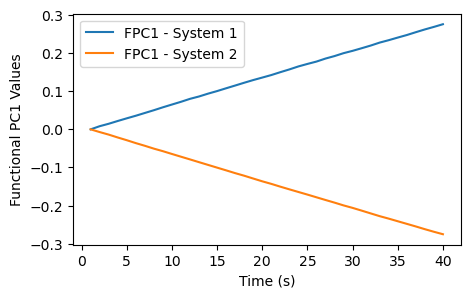

alt.VConcatChart(...)

In [48]:
pc_scores_s1_A_blood_cal_window, pc_scores_s2_A_blood_cal_window,fpca_s1_A_blood_cal_window,fpca_s2_A_blood_cal_window = fpca_two_inputs(A1_blood_cal_window_zero, A2_blood_cal_window_zero)
create_pc_scores_plots(pc_scores_s1_A_blood_cal_window, pc_scores_s2_A_blood_cal_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor A - Aqueous - Cal Window

S1 Explain variance FPC1 (%):  99.87781445766493
S2 Explain variance FPC1 (%):  99.95534234043755


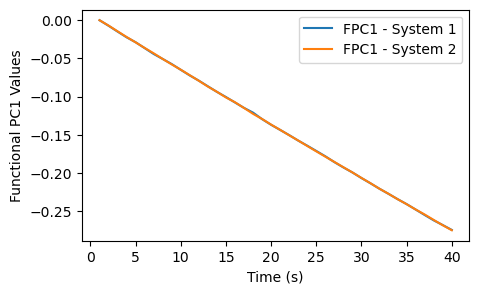

alt.VConcatChart(...)

In [49]:
pc_scores_s1_A_aqueous_cal_window, pc_scores_s2_A_aqueous_cal_window,fpca_s1_A_aqueous_cal_window,fpca_s2_A_aqueous_cal_window = fpca_two_inputs(A1_aqueous_cal_window_zero, A2_aqueous_cal_window_zero)
create_pc_scores_plots(pc_scores_s1_A_aqueous_cal_window, pc_scores_s2_A_aqueous_cal_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor A - Blood - Sample Window

S1 Explain variance FPC1 (%):  99.67490316719156
S2 Explain variance FPC1 (%):  99.880186519481


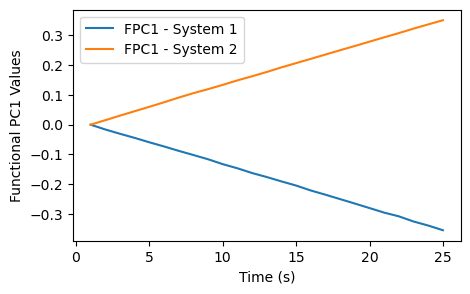

alt.VConcatChart(...)

In [50]:
pc_scores_s1_A_blood_sample_window, pc_scores_s2_A_blood_sample_window,fpca_s1_A_blood_sample_window,fpca_s2_A_blood_sample_window = fpca_two_inputs(A1_blood_sample_window_zero, A2_blood_sample_window_zero)
create_pc_scores_plots(pc_scores_s1_A_blood_sample_window, pc_scores_s2_A_blood_sample_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor A - Aqueous - Sample Window

S1 Explain variance FPC1 (%):  99.39174250730987
S2 Explain variance FPC1 (%):  99.80038701471759


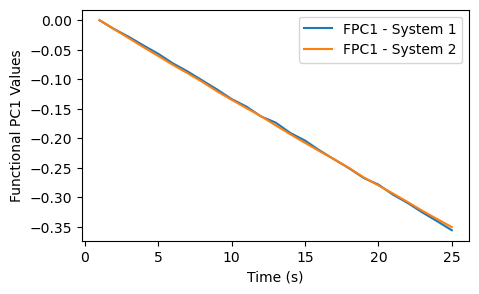

alt.VConcatChart(...)

In [51]:
pc_scores_s1_A_aqueous_sample_window, pc_scores_s2_A_aqueous_sample_window,fpca_s1_A_aqueous_sample_window,fpca_s2_A_aqueous_sample_window = fpca_two_inputs(A1_aqueous_sample_window_zero, A2_aqueous_sample_window_zero)
create_pc_scores_plots(pc_scores_s1_A_aqueous_sample_window, pc_scores_s2_A_aqueous_sample_window, A1_Merged, A2_Merged)

### System 1 versus System 2: Sensor B - Aqueous - Cal Window

S1 Explain variance FPC1 (%):  99.83154647821614
S2 Explain variance FPC1 (%):  99.87719328222387


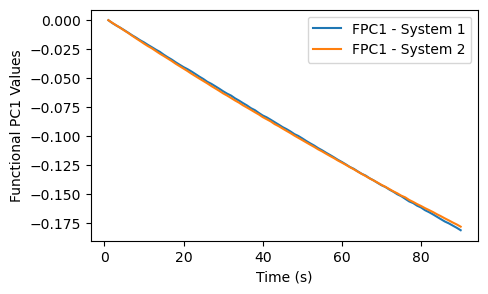

alt.VConcatChart(...)

In [52]:
pc_scores_s1_B_aqueous_cal_window, pc_scores_s2_B_aqueous_cal_window,fpca_s1_B_aqueous_cal_window,fpca_s2_B_aqueous_cal_window = fpca_two_inputs(B1_aqueous_cal_window_zero, B2_aqueous_cal_window_zero)
create_pc_scores_plots(pc_scores_s1_B_aqueous_cal_window, pc_scores_s2_B_aqueous_cal_window, B1_Merged, B2_Merged)

### System 1 versus System 2: Sensor B - Aqueous - Sample Window

S1 Explain variance FPC1 (%):  99.87053811175977
S2 Explain variance FPC1 (%):  99.8807233641277


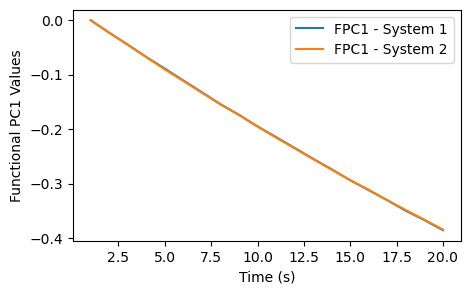

alt.VConcatChart(...)

In [53]:
pc_scores_s1_B_aqueous_sample_window, pc_scores_s2_B_aqueous_sample_window,fpca_s1_B_aqueous_sample_window,fpca_s2_B_aqueous_sample_window = fpca_two_inputs(B1_aqueous_sample_window_zero, B2_aqueous_sample_window_zero)
create_pc_scores_plots(pc_scores_s1_B_aqueous_sample_window, pc_scores_s2_B_aqueous_sample_window, B1_Merged, B2_Merged)

### System 1 versus System 2: Sensor B - Blood - Cal Window

S1 Explain variance FPC1 (%):  99.80074865792018
S2 Explain variance FPC1 (%):  99.89884570165515


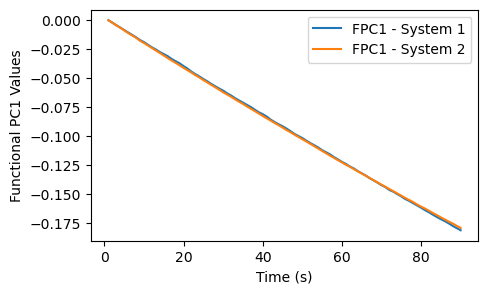

alt.VConcatChart(...)

In [54]:
pc_scores_s1_B_blood_cal_window, pc_scores_s2_B_blood_cal_window,fpca_s1_B_blood_cal_window,fpca_s2_B_blood_cal_window = fpca_two_inputs(B1_blood_cal_window_zero, B2_blood_cal_window_zero)
create_pc_scores_plots(pc_scores_s1_B_blood_cal_window, pc_scores_s2_B_blood_cal_window, B1_Merged, B2_Merged)

### System 1 versus System 2: Sensor B - Blood - Sample Window

S1 Explain variance FPC1 (%):  99.2766297832728
S2 Explain variance FPC1 (%):  99.78528724454027


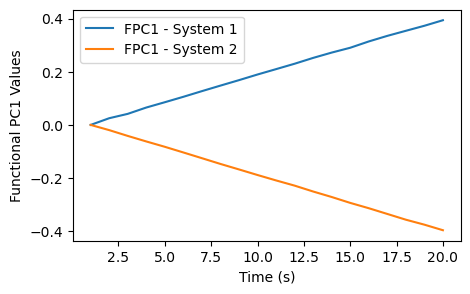

alt.VConcatChart(...)

In [55]:
pc_scores_s1_B_blood_sample_window, pc_scores_s2_B_blood_sample_window,fpca_s1_B_blood_sample_window,fpca_s2_B_blood_sample_window = fpca_two_inputs(B1_blood_sample_window_zero, B2_blood_sample_window_zero)
create_pc_scores_plots(pc_scores_s1_B_blood_sample_window, pc_scores_s2_B_blood_sample_window, B1_Merged, B2_Merged)

## 8.3 Linear Regression

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.517e+05
Date:                Fri, 07 Jun 2024   Prob (F-statistic):           8.66e-37
Time:                        18:40:53   Log-Likelihood:                 104.52
No. Observations:                  20   AIC:                            -205.0
Df Residuals:                      18   BIC:                            -203.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0181      0.001    -28.483      0.0

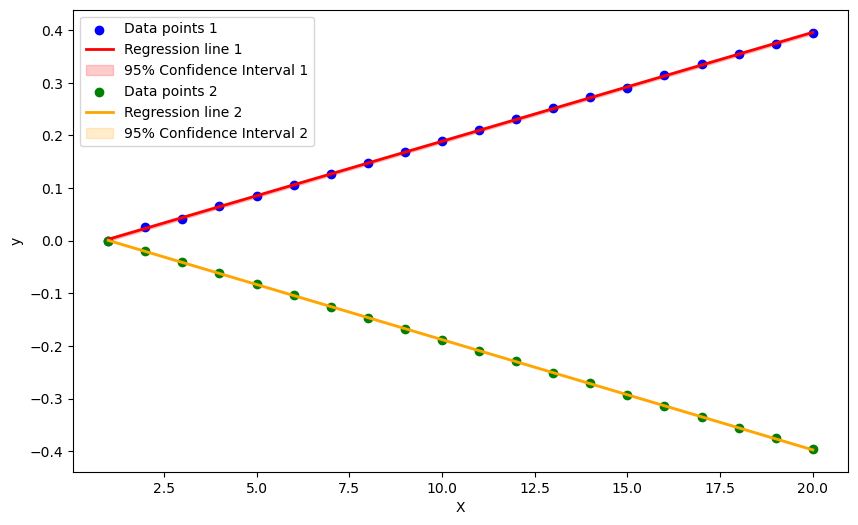

In [56]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assume you already have data for x1, y1, x2, and y2
x1 = fpca_s1_B_blood_sample_window.grid_points[0]
y1 = fpca_s1_B_blood_sample_window.data_matrix[0].flatten()
x2 = fpca_s2_B_blood_sample_window.grid_points[0]
y2 = fpca_s2_B_blood_sample_window.data_matrix[0].flatten()

# Add a constant to the feature variables
x1_with_const = sm.add_constant(x1)
x2_with_const = sm.add_constant(x2)

# Create and fit a linear regression model for x1 and y1
model1 = sm.OLS(y1, x1_with_const).fit()

# Create and fit a linear regression model for x2 and y2
model2 = sm.OLS(y2, x2_with_const).fit()

# Output detailed summary of the models
summary1 = model1.summary()
summary2 = model2.summary()
print(summary1)
print(summary2)

# Extract predicted values from the models
y1_pred = model1.predict(x1_with_const)
y2_pred = model2.predict(x2_with_const)

# Compute confidence intervals
pred1 = model1.get_prediction(x1_with_const)
pred_summary1 = pred1.summary_frame(alpha=0.05)  # 95% confidence interval
ci_lower1 = pred_summary1['obs_ci_lower']
ci_upper1 = pred_summary1['obs_ci_upper']

pred2 = model2.get_prediction(x2_with_const)
pred_summary2 = pred2.summary_frame(alpha=0.05)  # 95% confidence interval
ci_lower2 = pred_summary2['obs_ci_lower']
ci_upper2 = pred_summary2['obs_ci_upper']

# Visualize the results
plt.figure(figsize=(10, 6))

# Plot results for the first set of data
plt.scatter(x1, y1, color='blue', label='Data points 1')
plt.plot(x1, y1_pred, color='red', linewidth=2, label='Regression line 1')
plt.fill_between(x1, ci_lower1, ci_upper1, color='red', alpha=0.2, label='95% Confidence Interval 1')

# Plot results for the second set of data
plt.scatter(x2, y2, color='green', label='Data points 2')
plt.plot(x2, y2_pred, color='orange', linewidth=2, label='Regression line 2')
plt.fill_between(x2, ci_lower2, ci_upper2, color='orange', alpha=0.2, label='95% Confidence Interval 2')

plt.xlabel("X")
plt.ylabel("y")
plt.legend()
plt.show()


# 9. Functional Regression

## Define useful function

In [57]:
def Function_regression(windows, Merge_dataset, len_time=40, predictor=["AmbientTemperature", "AgeOfCardInDaysAtTimeOfTest"]):
    """
    Perform functional regression using the given data.

    Parameters:
    windows (DataFrame): The dataset containing the time series data.
    Merge_dataset (DataFrame): The dataset containing the predictors.
    len_time (int): The number of basis functions to use for the Fourier basis. Default is 40.
    predictor (list): The list of predictor variables to use in the regression. Default includes 'AmbientTemperature' and 'AgeOfCardInDaysAtTimeOfTest'.

    Returns:
    funct_reg (LinearRegression): The fitted linear regression model.
    """

    # Prepare Data
    # Transform the time series data into a list
    merged_column = [list(row) for row in windows.iloc[:, :].to_numpy()]

    # Convert the list to functional data object with Fourier basis
    Y = FDataGrid(merged_column, grid_points=range(len(merged_column[1])))
    basis = FourierBasis(n_basis=len_time)
    y = Y.coordinates[0].to_basis(basis)

    # Prepare the predictor data
    x = Merge_dataset.loc[:, predictor]

    # Fit the linear regression model
    funct_reg = LinearRegression(fit_intercept=True)
    funct_reg.fit(x, y)

    # Print model summary
    print("To check if we need to move any time stamp", "\n")
    intercept = funct_reg.intercept_
    print("The intercept of this model is:", intercept, "\n")
    for i in range(len(predictor)):
        coef = funct_reg.coef_[i]
        print("The coefficient of {} of this model is: {}".format(predictor[i], coef), "\n")

    return funct_reg


In [58]:
def coefficent_visualization(funct_reg, funct_reg2, predictor, interval, title):
    """
    Visualize the coefficients of two functional regression models over a specified interval.

    Parameters:
    funct_reg (LinearRegression): The first fitted linear regression model.
    funct_reg2 (LinearRegression): The second fitted linear regression model.
    predictor (list): The list of predictor variables.
    interval (slice): The slice object representing the interval of interest for the coefficients.
    title (str): The title for the overall plot.

    Returns:
    None: This function displays the plots of the coefficients.
    """
    num_predictors = len(predictor)
    num_intervals = len(funct_reg.intercept_.coefficients[0][interval])

    fig, axs = plt.subplots(num_predictors + 1, 1, figsize=(8, 6*num_predictors))

    # Set the overall title for the figure
    fig.suptitle(title, fontsize=16)

    # Plot the intercepts for both systems
    axs[0].plot(np.arange(num_intervals), funct_reg.intercept_.coefficients[0][interval], label='Intercept in system 1')
    axs[0].plot(np.arange(num_intervals), funct_reg2.intercept_.coefficients[0][interval], label='Intercept in system 2')
    axs[0].legend()
    axs[0].set_title('Intercept')

    # Plot the coefficients for each predictor
    for i in range(num_predictors):
        axs[i + 1].plot(np.arange(num_intervals), funct_reg.coef_[i].coefficients[0][interval], label='Coefficient in system 1')
        axs[i + 1].plot(np.arange(num_intervals), funct_reg2.coef_[i].coefficients[0][interval], label='Coefficient in system 2')
        axs[i + 1].legend()
        axs[i + 1].set_title(predictor[i])

    # Adjust the layout to make room for the title
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


## Regression result

This is the coeffcient from the output of the model.
Because of the different magnitude, we need to choose which time stamps will we visualize

### Cal window

#### Sensor A

##### General

In [59]:
print("System 1:")
A1_cal_window_funct_reg = Function_regression(A1_cal_window,A1_Merged,40,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
A2_cal_window_funct_reg = Function_regression(A2_cal_window,A2_Merged,40,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 40.0),), n_basis=41, period=40.0),
    coefficients=[[ 5.66084940e+02 -3.40252064e+01  8.82549945e+00 -2.00662195e+00
       1.54360484e+01 -9.16580385e+00 -1.31187149e+01 -1.66868858e+01
      -1.26003005e+01  1.36805152e+01 -1.97336462e+01  3.33110221e+01
       6.90947007e+00  1.77335361e+00  2.03501515e+00 -7.95541919e+00
       1.50617621e+01 -1.31188099e+01  5.78833887e+00 -1.47379558e+01
       1.06993243e+01 -3.13814858e+01  1.75595615e+01 -3.14904603e+01
      -7.31933387e+00 -1.09911431e+01 -3.66689688e+00 -2.76792733e+01
       8.27349450e+00  5.73793405e+00 -1.06424902e+01 -5.17577233e+00
       1.16090463e+01  3.61879648e+01 -2.43102416e+01  2.62136648e+01
      -1.67139164e+01  8.80944587e+00  2.34797550e+01 -6.54778130e+14
      -1.58427221e+00]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=Fou

##### Blood

In [60]:
print("System 1:")
A1_blood_cal_window_funct_reg = Function_regression(A1_blood_cal_window,A1_blood_Merged,40,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
A2_blood_cal_window_funct_reg = Function_regression(A2_blood_cal_window,A2_blood_Merged,40,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 40.0),), n_basis=41, period=40.0),
    coefficients=[[ 1.30887471e+03  2.53612781e+01  4.49386094e+01 -1.30409946e+02
       2.05646713e+01 -4.80155025e+01  5.77801737e+01  6.17961562e+01
       8.71409064e+01  5.55178424e+01 -3.87831431e+01  1.56958806e+02
       3.52011871e+01 -1.06383914e+02  1.56920998e+02 -1.44944934e+02
       5.74102748e+01 -2.40224264e+01 -7.05340941e+01 -2.87465686e+02
      -2.90895969e+01  5.66928677e+01 -7.42140571e+01  1.02096242e+01
      -1.86039975e+02  6.05135258e+01  7.38292715e+01 -2.49003292e+01
      -6.56218122e+01  1.30735444e+02  1.64061834e+02 -7.03291375e+01
      -3.06710990e+02 -2.17173630e+02 -9.29222895e+01 -3.80028762e+01
      -4.37188249e+01 -1.38165359e+02 -2.01639098e+02 -1.84776366e+15
       1.80875922e+01]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=Fou

##### Aqueous

In [61]:
print("System 1:")
A1_aqueous_cal_window_funct_reg = Function_regression(A1_aqueous_cal_window,A1_aqueous_Merged,40,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
A2_aqueous_cal_window_funct_reg = Function_regression(A2_aqueous_cal_window,A2_aqueous_Merged,40,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 40.0),), n_basis=41, period=40.0),
    coefficients=[[ 8.19051536e+02 -9.57272555e+00  5.84462656e+00 -6.85555112e+00
      -2.46248557e+00  3.10759409e+01  9.39125438e+00  1.47889563e+01
       2.53572050e+01  1.07827698e+01  1.23376056e+01 -7.86876275e-01
      -6.43519196e+00  1.76265233e+00 -6.24718264e+00  1.77168132e+01
      -1.26284266e+01 -2.51779324e+01 -4.07675512e+00  5.04656669e-01
       3.75160069e+00 -7.71912673e+00  1.06348172e+01 -1.44866616e+01
       2.78421292e+01 -1.49125315e+01 -1.08444767e+01  4.63236262e+01
      -3.33380164e+01 -1.45646732e+01  6.33908269e+00 -5.16952543e+00
      -1.98905000e+01 -1.31288246e+01  1.35215494e+00  4.26629182e+01
       1.66537022e+00  1.31949691e+01 -1.72989647e+01 -1.01256642e+15
      -5.03081411e+00]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=Fou

#### Sensor B

##### Blood

In [62]:
print("System 1:")
B1_blood_cal_window_funct_reg = Function_regression(B1_blood_cal_window,B1_blood_Merged,90,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
B2_blood_cal_window_funct_reg = Function_regression(B2_blood_cal_window,B2_blood_Merged,90,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 90.0),), n_basis=91, period=90.0),
    coefficients=[[-1.01844246e+03  7.57705631e+01  4.01901184e+01  5.96684027e+02
       9.49348533e+01 -2.88238357e+01  2.34068446e+02 -9.65770512e+02
       1.26618184e+02 -1.38455973e+02  7.84128151e+02 -5.56345058e+02
      -2.98366928e+02  2.43756441e+03 -3.98746533e+02  3.24813148e+01
       5.99579009e+02  3.32656992e+03  1.81548746e+02  9.17391027e+01
      -2.57310342e+02  3.05676484e+02 -2.14108781e+02 -3.02348085e+02
      -2.61921634e+02 -7.00822007e+02 -5.52715812e+02 -4.77440586e+02
      -1.16971174e+02 -1.49154498e+03 -2.59376744e+02 -8.36535635e+01
       6.82654055e+01 -1.66333627e+02 -4.55972534e+02  1.61338776e+02
       6.57603519e+02 -6.66692274e+02 -1.96320150e+02 -7.54821804e+02
       5.21681619e+02  1.14817209e+02 -6.00256338e+02  4.56469243e+02
      -6.97062246e+02  2.72569979e+03  

##### Aqueous

In [63]:
print("System 1:")
B1_aqueous_cal_window_funct_reg = Function_regression(B1_aqueous_cal_window,B1_aqueous_Merged,90,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
B2_aqueous_cal_window_funct_reg = Function_regression(B2_aqueous_cal_window,B2_aqueous_Merged,90,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 90.0),), n_basis=91, period=90.0),
    coefficients=[[-2.25086787e+03 -9.51011737e+01  5.21763201e+00 -6.19276493e+01
      -4.50748483e+01  1.12682513e+02  1.64626068e+01 -8.47320672e+01
      -1.02813763e+02  7.59699847e+01  7.82506946e+01 -6.62978165e+01
       6.50724932e+01  1.59301780e+02  4.40022120e+01 -1.69941421e+00
       3.28684276e+02 -1.90414469e+02  2.40741411e+01 -3.08869237e+01
      -1.43596037e+02  8.40144240e+01  1.12515868e+02 -2.52864793e+02
       1.77014752e+02 -2.24481003e+02  7.37825088e+01  1.77730916e+02
       1.02949351e+02 -8.34710567e+01  1.77844450e+00  5.53161235e+01
      -3.90866556e+00 -1.49005362e+02  8.37616625e+01 -3.49943699e+02
       6.26926618e+01  3.10049686e+02  5.54222150e+01  4.65158270e+01
      -2.28470277e+02  1.25192675e+02 -4.87459997e+01 -1.92222983e+02
       2.50795796e+02  3.97789169e+02 -

### Sample window

#### Sensor A

##### General

In [64]:
print("System 1:")
A1_sample_window_funct_reg = Function_regression(A1_sample_window,A1_Merged,25,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
A2_sample_window_funct_reg = Function_regression(A2_sample_window,A2_Merged,25,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 25.0),), n_basis=25, period=25.0),
    coefficients=[[ 5.28823213e+02  3.13830219e-02  2.45269379e-02  2.18497848e-02
       9.41304036e-03  5.28117428e-03 -2.09241712e-04  5.39758718e-03
       2.36331612e-03  6.67724324e-03 -4.36379596e-03  7.45319909e-03
      -4.38351763e-04 -2.50762004e-03  2.55810363e-03  8.25100940e-04
      -2.37926509e-03 -9.43995807e-04  3.10563121e-03 -2.40780114e-03
      -2.47485293e-03  1.59295194e-03 -1.48910090e-03  3.13437471e-03
       3.76971618e-03]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 25.0),), n_basis=25, period=25.0),
    coefficients=[[-1.91198329e+01  5.05256295e-03 -2.69901112e-04  2.27169132e-03
      -2.17441524e-04  1.86250741e-03  1.15674218e-04  1.29491073e-03
      -6.81104495e-05  8.61364449e-04  2.40987744e-04  5.50636

##### Blood

In [65]:
print("System 1:")
A1_blood_sample_window_funct_reg = Function_regression(A1_blood_sample_window,A1_blood_Merged,25,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
A2_blood_sample_window_funct_reg = Function_regression(A2_blood_sample_window,A2_blood_Merged,25,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 25.0),), n_basis=25, period=25.0),
    coefficients=[[ 1.11363543e+03 -1.40576155e-01 -2.63501654e-03 -6.96189377e-02
       6.46604144e-02 -8.91422686e-02  4.81355382e-03 -3.56417044e-02
       2.26833646e-02 -1.40469701e-02 -1.31438451e-02  3.31212261e-03
       1.05283837e-02 -2.10685944e-02  1.89161359e-02  1.83693069e-02
      -2.39859937e-02 -1.45742384e-02  1.64222165e-02  2.77523846e-02
       3.45134396e-02 -2.74668320e-02 -2.10915807e-02 -2.59291627e-03
      -3.12442392e-02]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 25.0),), n_basis=25, period=25.0),
    coefficients=[[-4.62046881e+01  1.13522823e-02  9.51183781e-04  5.59416366e-03
      -2.80819952e-03  5.57235386e-03 -8.07749522e-05  2.83839963e-03
      -9.45748689e-04  1.41116442e-03  6.30578964e-04  6.30144

##### Aqueous

In [66]:
print("System 1:")
A1_aqueous_sample_window_funct_reg = Function_regression(A1_aqueous_sample_window,A1_aqueous_Merged,25,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
A2_aqueous_sample_window_funct_reg = Function_regression(A2_aqueous_sample_window,A2_aqueous_Merged,25,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 25.0),), n_basis=25, period=25.0),
    coefficients=[[ 7.02709802e+02 -4.21844477e-01  3.11325348e-02 -2.02105649e-01
       2.05977179e-02 -1.43178225e-01  3.39445136e-03 -9.74742429e-02
       1.14205336e-02 -6.37808776e-02 -6.32851586e-03 -6.21920187e-02
       1.05712166e-02 -5.76327575e-02  1.35566460e-03 -3.33190829e-02
      -2.31299881e-02 -2.82411342e-02  1.73052498e-02 -2.05807131e-02
      -1.21652915e-02 -3.16981057e-03 -1.98690578e-02  7.34270396e-04
       2.86723375e-03]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 25.0),), n_basis=25, period=25.0),
    coefficients=[[-2.76186360e+01  2.65689950e-02 -3.51052797e-04  1.29310927e-02
      -7.02359767e-04  8.89625252e-03 -1.88729270e-05  6.27849647e-03
      -4.53990228e-04  4.22494690e-03  3.68053751e-04  3.76649

#### Sensor B

##### Blood

In [67]:
print("System 1:")
B1_blood_sample_window_funct_reg = Function_regression(B1_blood_sample_window,B1_blood_Merged,20,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
B2_blood_sample_window_funct_reg = Function_regression(B2_blood_sample_window,B2_blood_Merged,20,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 20.0),), n_basis=21, period=20.0),
    coefficients=[[-3.11002330e+01  3.87960507e+00  4.90041945e+01 -9.40607334e+01
       2.87223379e+02  5.35698427e+01 -2.07878035e+02  6.12114529e+01
       3.15783560e+01  2.77111063e+02 -1.43256696e+02 -1.69555211e+02
      -1.72960727e+02 -5.67165056e+01 -2.44053778e+02 -1.57374054e+02
      -3.50323332e+02  1.37216865e+02  2.09598908e+02 -2.75529822e+15
       1.33752232e+01]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 20.0),), n_basis=21, period=20.0),
    coefficients=[[-5.29301290e+01 -2.18564981e-01 -2.22049382e+00  4.20682563e+00
      -1.29031871e+01 -2.41553680e+00  9.36140556e+00 -2.78556543e+00
      -1.38401769e+00 -1.25943817e+01  6.48014652e+00  7.63995493e+00
       7.72291977e+00  2.54798845e+00  1.09729443e+01  7.05326

##### Aqueous

In [68]:
print("System 1:")
B1_aqueous_sample_window_funct_reg = Function_regression(B1_aqueous_sample_window,B1_aqueous_Merged,20,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])
print("----------------------------------------------------------------------------")
print("\n","System 2:")
B2_aqueous_sample_window_funct_reg = Function_regression(B2_aqueous_sample_window,B2_aqueous_Merged,20,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"])


System 1:
To check if we need to move any time stamp 

The intercept of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 20.0),), n_basis=21, period=20.0),
    coefficients=[[-9.42720641e+02 -4.90383677e+00 -2.55574652e+01 -3.12354110e+00
       3.33367602e+01  3.61710760e-01  2.65939003e+01  5.13677642e+01
      -1.92017562e+01  3.06007166e+01 -2.98447749e+01 -4.23536559e+01
       6.42142685e+01  2.42248465e+01 -1.45602622e+01 -5.90161830e+01
      -1.21973584e+01  4.66252598e+01 -3.08887944e+01 -2.04737293e+15
       1.27489983e+01]]) 

The coefficient of AmbientTemperature of this model is: FDataBasis(
    _basis=FourierBasis(domain_range=((0.0, 20.0),), n_basis=21, period=20.0),
    coefficients=[[-1.36142057e+01  1.90784592e-01  1.13479152e+00  1.15562009e-01
      -1.48356553e+00 -2.69851739e-02 -1.18605923e+00 -2.31917083e+00
       8.95551435e-01 -1.44933987e+00  1.34804964e+00  1.88453067e+00
      -2.92636639e+00 -1.10065822e+00  6.53761023e-01  2.61209

## Visulize coefficients


### Cal window

#### Sensor A


As the result show above, the value at time point 39 is of the exponent of 14,
which is significantly greater than the rest of the data. And the first time point is also larger than others
* Same case in both systems.
* Same case in different Fluid Type

So for the convenience of visualization, we remove these points.

##### General

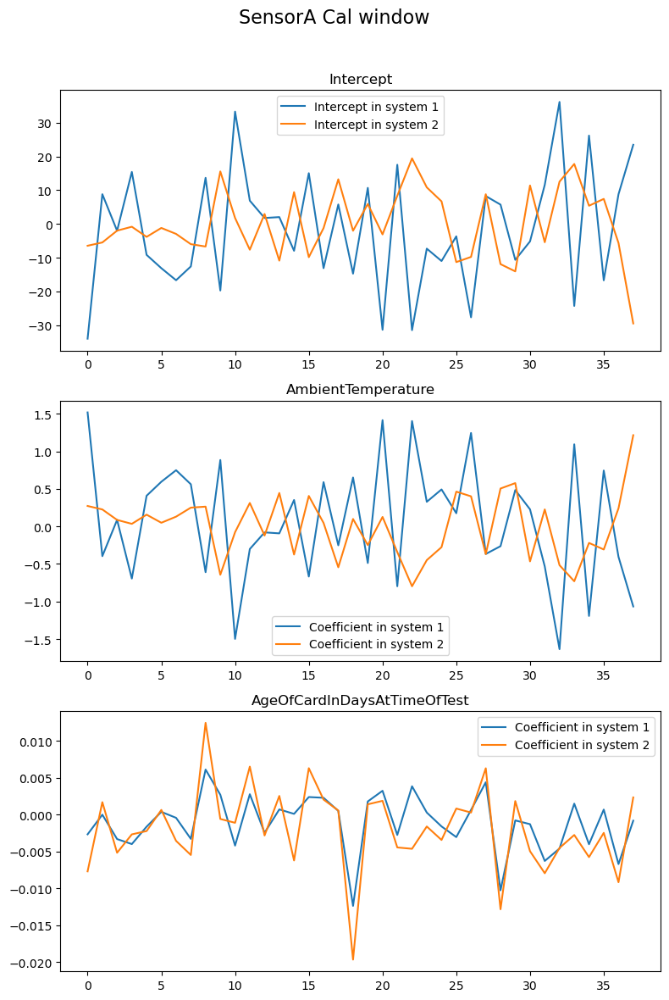

In [69]:
coefficent_visualization(A1_cal_window_funct_reg,A2_cal_window_funct_reg,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"],range(1,39),"SensorA Cal window")


##### Blood

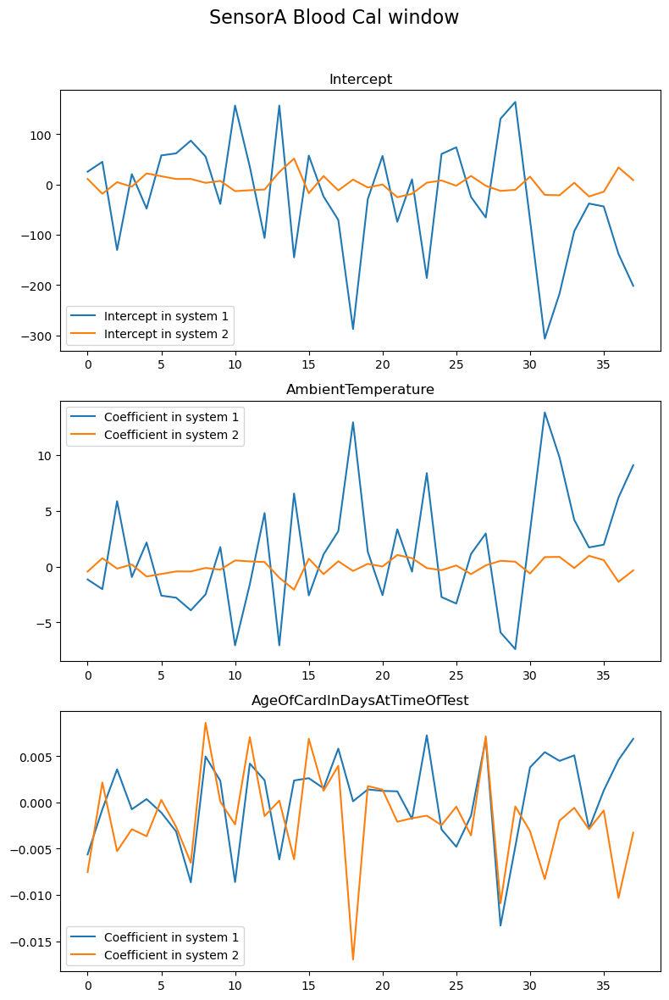

In [70]:
coefficent_visualization(A1_blood_cal_window_funct_reg,A2_blood_cal_window_funct_reg,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"],range(1,39),"SensorA Blood Cal window")


##### Aqueous

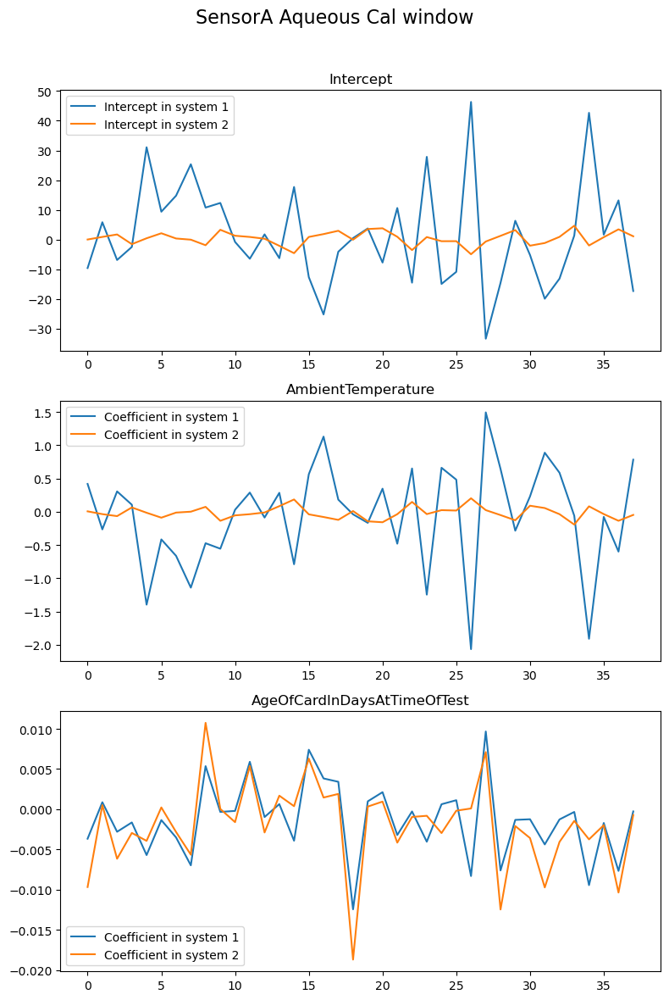

In [71]:
coefficent_visualization(A1_aqueous_cal_window_funct_reg,A2_aqueous_cal_window_funct_reg,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"],range(1,39),"SensorA Aqueous Cal window")


#### Sensor B

##### Blood

As the result show above, the value at time point 89 way higher than others. And also the first time point is also larger than others; Same case in both systems. So for the convenience of visualization, we remove these points.



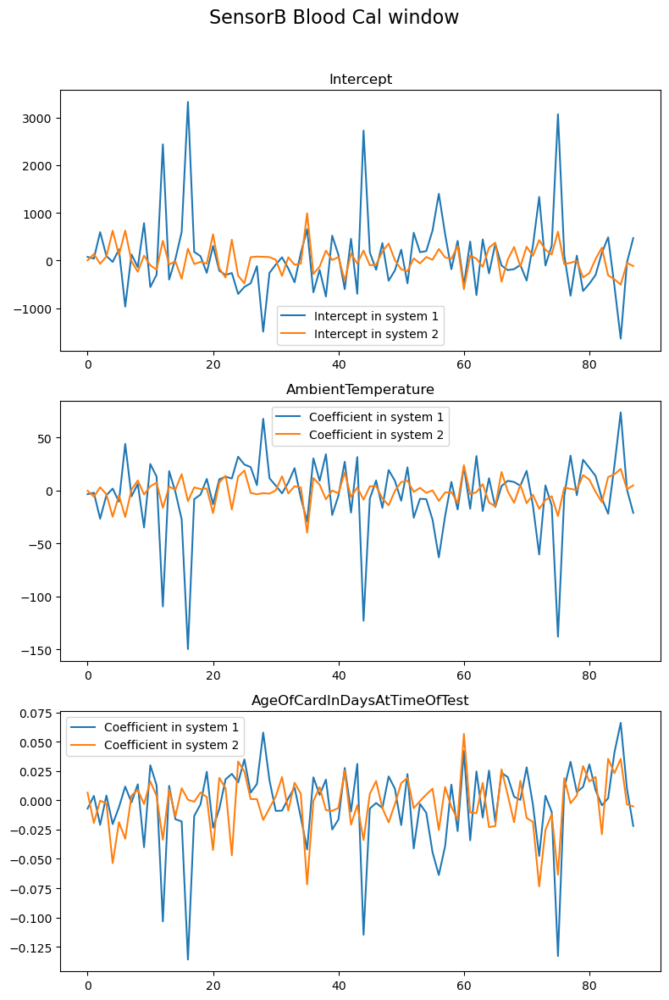

In [72]:
coefficent_visualization(B1_blood_cal_window_funct_reg,B2_blood_cal_window_funct_reg,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"],range(1,89),"SensorB Blood Cal window")


##### Aqueous

As the result show above, the value at time point 89 way higher than others. And also the first time point is also larger than others; Same case in both systems. So for the convenience of visualization, we remove these points.



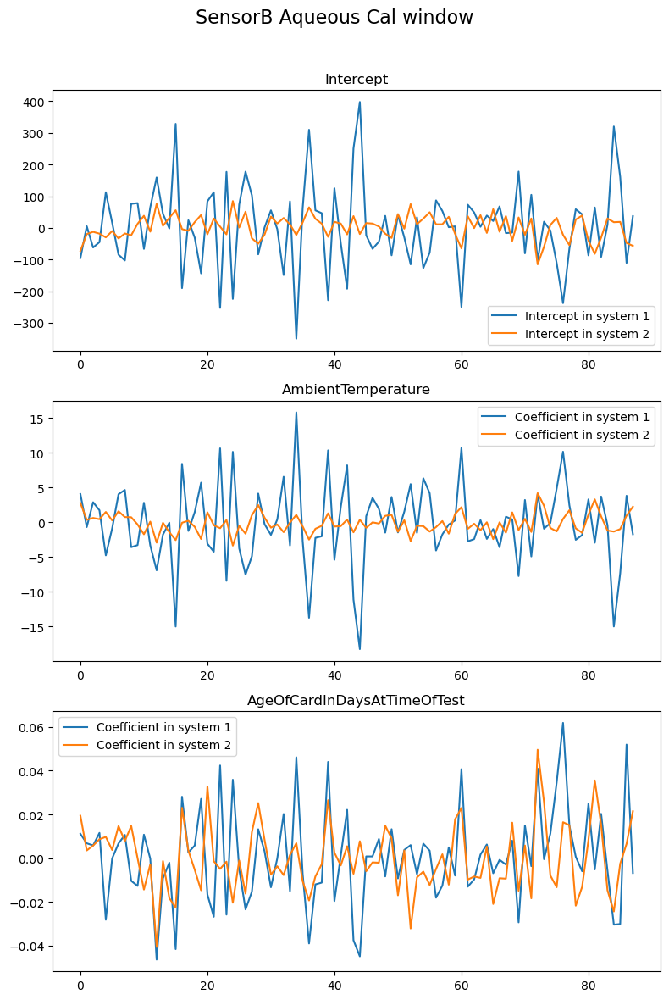

In [73]:
coefficent_visualization(B1_aqueous_cal_window_funct_reg,B2_aqueous_cal_window_funct_reg,["AmbientTemperature","AgeOfCardInDaysAtTimeOfTest"],range(1,89),"SensorB Aqueous Cal window")


### Sample window

#### Sensor A


As the result show above, The first time point is also larger than others
* Same case in both systems.
* Same case in different Fluid Type

So for the convenience of visualization, we remove this point.

##### General

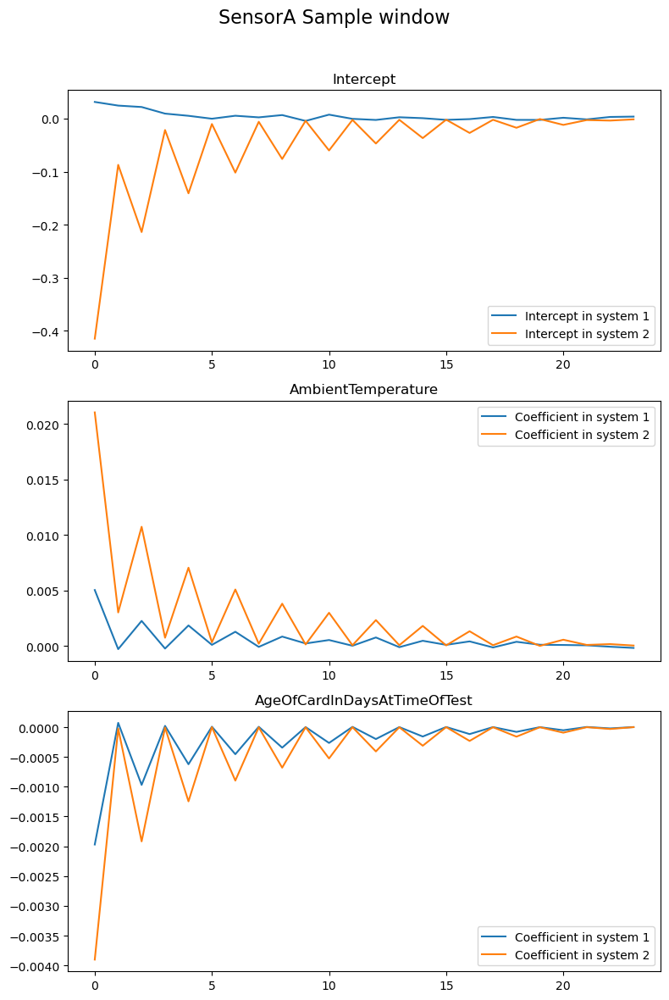

In [74]:
coefficent_visualization(A1_sample_window_funct_reg, A2_sample_window_funct_reg, ["AmbientTemperature", "AgeOfCardInDaysAtTimeOfTest"], range(1,25), "SensorA Sample window")


##### Blood

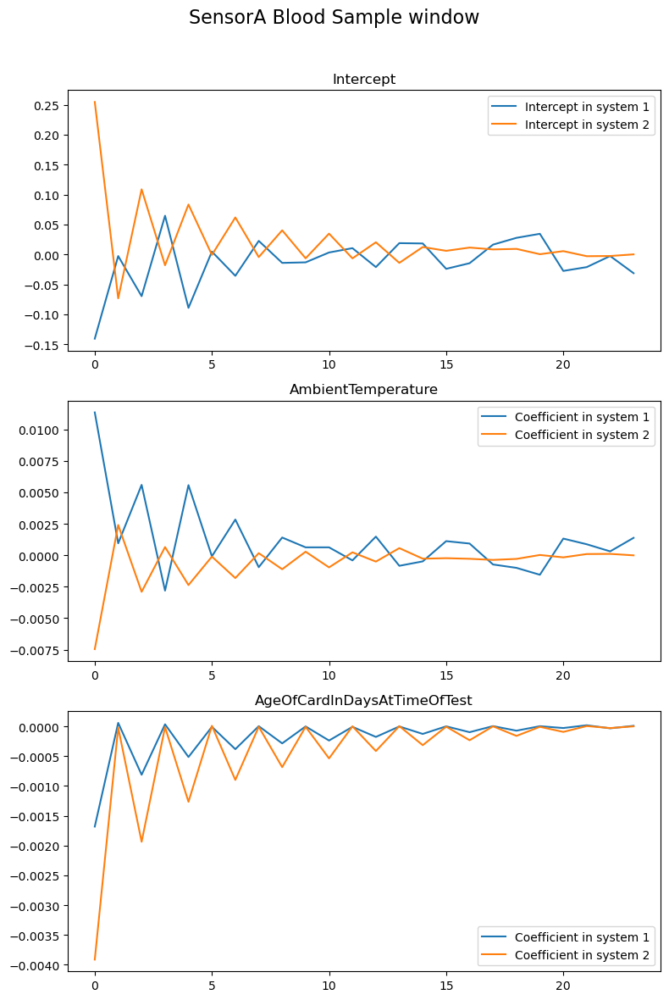

In [75]:
coefficent_visualization(A1_blood_sample_window_funct_reg, A2_blood_sample_window_funct_reg, ["AmbientTemperature", "AgeOfCardInDaysAtTimeOfTest"], range(1, 25), "SensorA Blood Sample window")

##### Aqueous

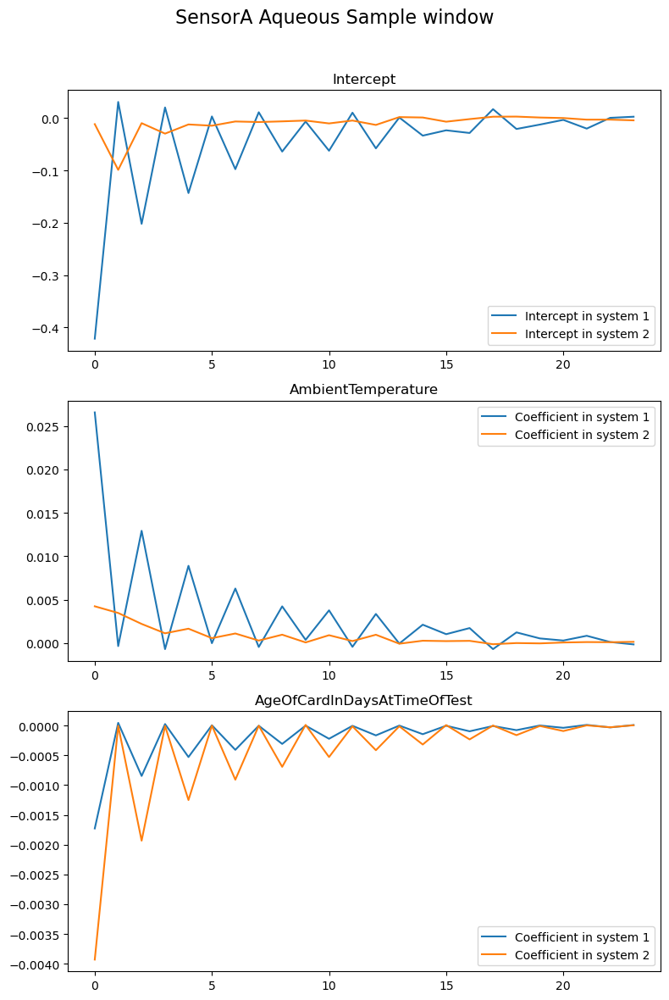

In [76]:
coefficent_visualization(A1_aqueous_sample_window_funct_reg, A2_aqueous_sample_window_funct_reg, ["AmbientTemperature", "AgeOfCardInDaysAtTimeOfTest"], range(1, 25), "SensorA Aqueous Sample window")


#### Sensor B

As the result show above, the value at time point 19 is significantly greater than the rest of the data. And the first time point is also larger than others;

Same case in both systems. So for the convenience of visualization, we remove these points.



##### Blood

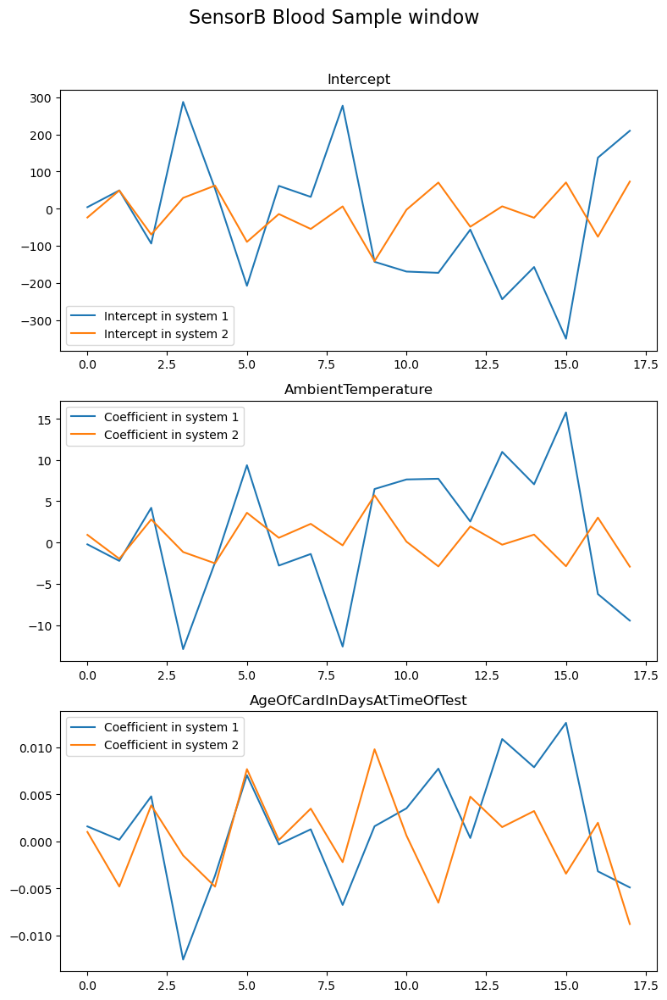

In [77]:
coefficent_visualization(B1_blood_sample_window_funct_reg, B2_blood_sample_window_funct_reg, ["AmbientTemperature", "AgeOfCardInDaysAtTimeOfTest"], range(1, 19), "SensorB Blood Sample window")

##### Aqueous

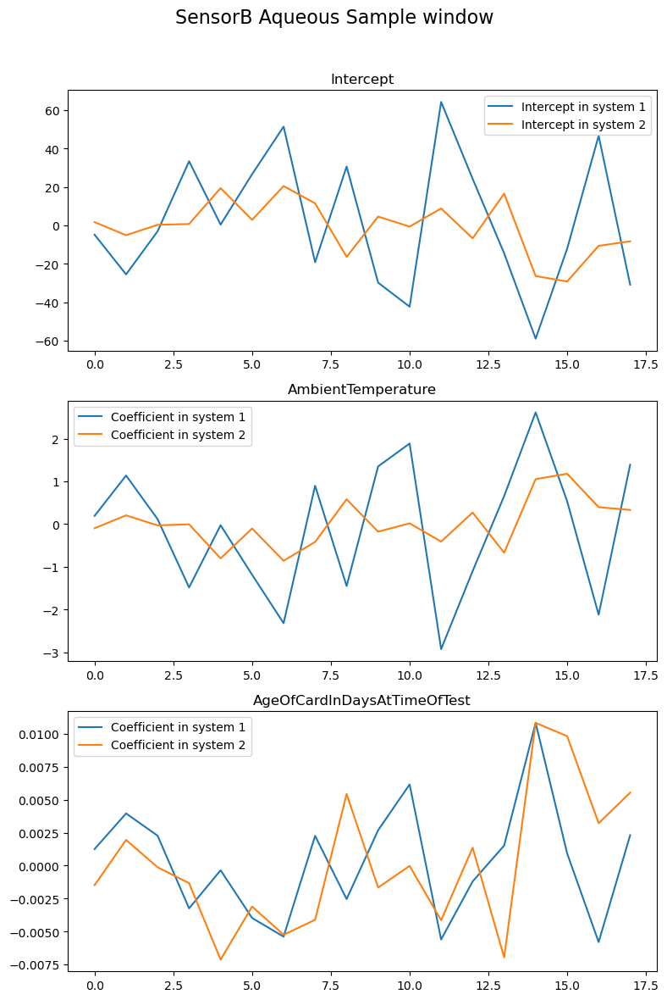

In [78]:
coefficent_visualization(B1_aqueous_sample_window_funct_reg, B2_aqueous_sample_window_funct_reg, ["AmbientTemperature", "AgeOfCardInDaysAtTimeOfTest"], range(1, 19), "SensorB Aqueous Sample window")
